<a id = "2"></a><br>
# Load Python Pakages


In [1]:
#basics
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")


#preprocessing
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, PowerTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce
from sklearn.compose import TransformedTargetRegressor
from sklearn.preprocessing import QuantileTransformer, quantile_transform


#statistics
from scipy import stats
from scipy.stats import skew
from scipy.special import boxcox1p
from scipy.stats import randint

#feature engineering
from sklearn.feature_selection import mutual_info_regression


#transformers and pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn import set_config


#algorithms
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import ElasticNet, Lasso, Ridge
from sklearn.svm import SVR


#model evaluation
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_validate
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, median_absolute_error, make_scorer
import optuna
from optuna.samplers import TPESampler
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice


#stacking
from sklearn.ensemble import StackingRegressor

random_state = 42


<a id = "3"></a><br>
#  First look to data

In [2]:
# Read the data
original_train_df = pd.read_csv('data.csv',  index_col='ID')

# reserved for pipeline
pipe_data = original_train_df.copy()

# use for preliminary analysis
train_df = original_train_df.copy()
train_df.head()

,Age,Sex,Education,BMI,Physical_activity_level,HgbA1C,Total_cholesterol,blood_triglycerids,blood_HDL,blood_LDL,...,DelayedRecall,delayed_repet,delayed_intrus,Processing_speed,Reasoning,Category_fluency,fluency_repet,fluency_intrus,Working_memory,SGST
ID,,,,,,,,,,,,,,,,,,,,,
10001,53,1,9,26.533,,,,,,,...,,,,,,,,,,
10002,60,1,12,,585,,,92,38,50,...,0,0,1,45,4,14,0,0,4,1.013
10004,69,1,12,21.427,,6.4952,106,,,,...,,,,,,,,,,
10005,70,2,5,26.508,1680,,,187,39,147,...,3,0,1,30,0,10,0,0,2,1.196
10006,51,2,6,26.892,,6.242,223,,,,...,,,,,,,,,,


In [3]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7108 entries, 10001 to 19193
Data columns (total 46 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Age                             7108 non-null   int64 
 1   Sex                             7108 non-null   int64 
 2   Education                       7108 non-null   int64 
 3   BMI                             7108 non-null   object
 4   Physical_activity_level         7108 non-null   object
 5   HgbA1C                          7108 non-null   object
 6   Total_cholesterol               7108 non-null   object
 7   blood_triglycerids              7108 non-null   object
 8   blood_HDL                       7108 non-null   object
 9   blood_LDL                       7108 non-null   object
 10  total_HDL_ratio                 7108 non-null   object
 11  blood_creatinine                7108 non-null   object
 12  blood_DHEA_S                    7108 non-nu

There are some empty entries, but they are not recognized as nan. Also, numerical columns are identified as objects. Let's correct these issues. 

In [4]:
train_df = train_df.replace(r'^\s*$', np.nan, regex=True)
features_need_type_change = train_df.select_dtypes(include='object').columns
train_df[features_need_type_change] = train_df[features_need_type_change].astype("float")
train_df = train_df.drop(train_df[train_df['Sex'] == 8].index)
train_df['Sex'] = train_df['Sex'].astype('category')
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7027 entries, 10001 to 19193
Data columns (total 46 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Age                             7027 non-null   int64   
 1   Sex                             7027 non-null   category
 2   Education                       7027 non-null   int64   
 3   BMI                             6325 non-null   float64 
 4   Physical_activity_level         1052 non-null   float64 
 5   HgbA1C                          1052 non-null   float64 
 6   Total_cholesterol               1052 non-null   float64 
 7   blood_triglycerids              1052 non-null   float64 
 8   blood_HDL                       1052 non-null   float64 
 9   blood_LDL                       1052 non-null   float64 
 10  total_HDL_ratio                 1052 non-null   float64 
 11  blood_creatinine                1052 non-null   float64 
 12  blood_DHEA_S   

## Missing values

In [5]:
missing = pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False))
missing.columns = ["missing_count"]
missing = missing.loc[(missing!=0).any(axis=1)]
missing["missing_percent"] = missing[0:] / len(train_df) *100
missing.style.background_gradient('viridis')

,missing_count,missing_percent
blood_CRP,5975,85.029173
blood_fasting_IGF1,5975,85.029173
Gait_average_m_sec,5975,85.029173
dopamin,5975,85.029173
epinefrin,5975,85.029173
Norepinefrin,5975,85.029173
blood_aminoterminal,5975,85.029173
bone_specific_alkalinefosfotaz,5975,85.029173
blood_n_telopeptide,5975,85.029173
serum_ICAM_1,5975,85.029173


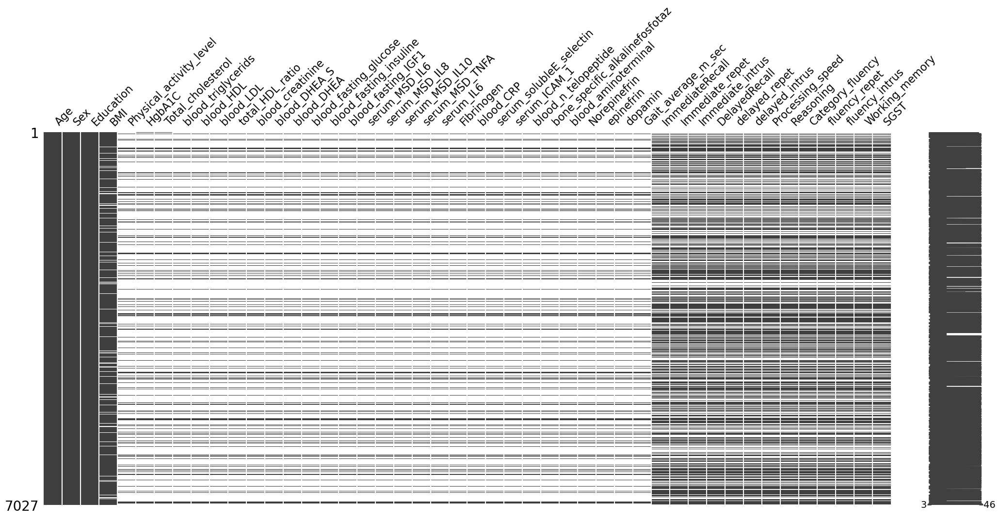

In [6]:
import missingno as msno
%matplotlib inline
msno.matrix(train_df)
plt.show()

There are many missing values. But our target will be Gait_average_m_sec. Lest's start with dropping missing values on Gait_average_m_sec, and visualize again.

In [7]:
train_df = train_df.dropna(subset=['Gait_average_m_sec'])

In [8]:
missing = pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False))
missing.columns = ["count"]
missing = missing.loc[(missing!=0).any(axis=1)]
missing["percent"] = missing[0:] / len(train_df) *100
missing.style.background_gradient('viridis')

,count,percent
SGST,38,3.612167
Reasoning,38,3.612167
ImmediateRecall,38,3.612167
Immediate_repet,38,3.612167
Immediate_intrus,38,3.612167
DelayedRecall,38,3.612167
delayed_intrus,38,3.612167
Processing_speed,38,3.612167
delayed_repet,38,3.612167
Category_fluency,38,3.612167


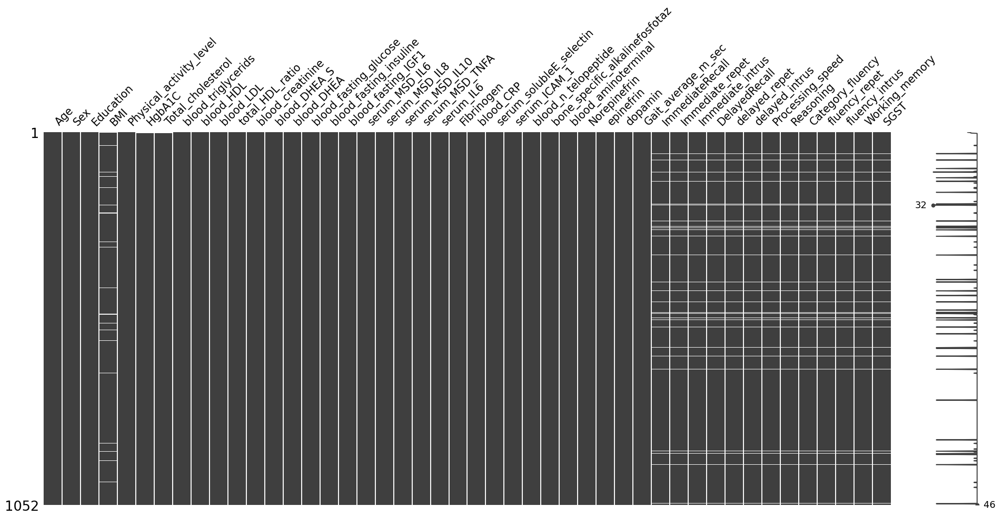

In [9]:
msno.matrix(train_df)
plt.show()

There are records that we have no cognitive data. I will also drop them.

In [10]:
train_df = train_df.dropna(subset=['Immediate_repet'])

In [11]:
missing = pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False))
missing.columns = ["count"]
missing = missing.loc[(missing!=0).any(axis=1)]
missing["percent"] = missing[0:] / 7108 *100
missing.style.background_gradient('viridis')

,count,percent
BMI,28,0.393922
HgbA1C,3,0.042206
Total_cholesterol,3,0.042206


<Axes: >

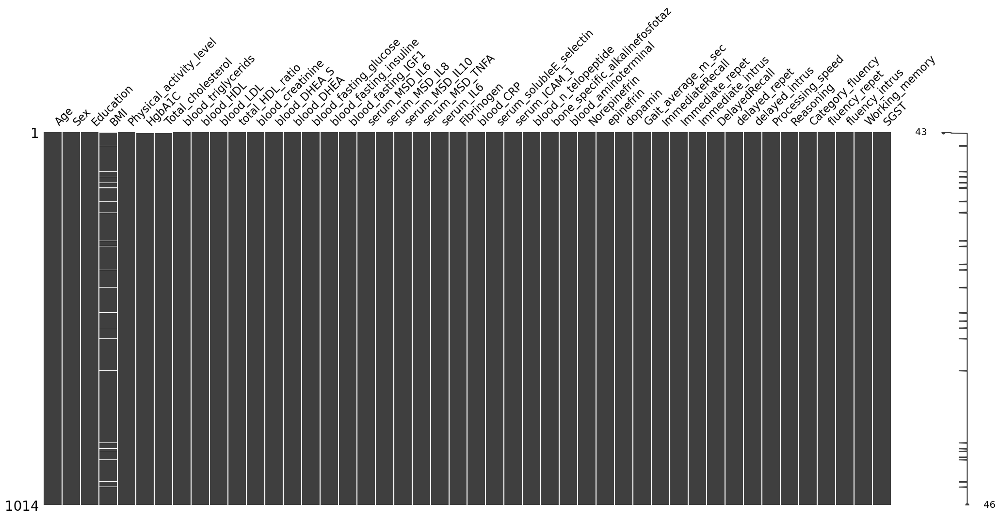

In [12]:
msno.matrix(train_df)

There are still some missing values on BMI.But we already droped many records. I think we can impute them. 

## Descpriptive statistics for numerical and categorical data

In [13]:
#numerical feature descriptive statistics
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1014.0,46.402367,11.830150,25.000000,37.00000,45.500000,55.000000,74.000000
Education,1014.0,7.655819,3.717157,2.000000,5.00000,8.000000,9.000000,97.000000
BMI,986.0,29.294109,14.795500,9.440000,23.15350,26.083000,29.843250,99.000000
Physical_activity_level,1014.0,1877.569576,7218.147183,0.000000,180.00000,720.000000,1800.000000,99998.000000
HgbA1C,1011.0,7.261776,10.886320,3.800000,5.59780,5.800000,6.115400,99.000000
Total_cholesterol,1011.0,194.248269,85.859652,91.000000,160.00000,184.000000,212.500000,999.000000
blood_triglycerids,1014.0,222.682446,936.219798,25.000000,79.00000,108.500000,162.000000,9999.000000
blood_HDL,1014.0,64.707101,99.399480,19.000000,42.00000,52.000000,65.000000,999.000000
blood_LDL,1014.0,116.029586,98.737175,16.000000,81.00000,102.000000,129.000000,999.000000
total_HDL_ratio,1014.0,4.786509,9.950820,1.340000,2.75000,3.520000,4.530000,99.000000


There are many strange values on MAX column. I think these are not real measurements but indicates something. They may be corrupted or missing records. Let's grab them and have a closer look.

In [14]:
contains_strange_values = train_df[train_df.isin([98, 99, 999, 998, 9999,9998]).any(axis=1)]

contains_strange_values.head(10).style.background_gradient('Reds')

,Age,Sex,Education,BMI,Physical_activity_level,HgbA1C,Total_cholesterol,blood_triglycerids,blood_HDL,blood_LDL,total_HDL_ratio,blood_creatinine,blood_DHEA_S,blood_DHEA,blood_fasting_glucose,blood_fasting_insuline,blood_fasting_IGF1,serum_MSD_IL6,serum_MSD_IL8,serum_MSD_IL10,serum_MSD_TNFA,serum_IL6,Fibrinogen,blood_CRP,serum_solubleE_selectin,serum_ICAM_1,blood_n_telopeptide,bone_specific_alkalinefosfotaz,blood_aminoterminal,Norepinefrin,epinefrin,dopamin,Gait_average_m_sec,ImmediateRecall,Immediate_repet,Immediate_intrus,DelayedRecall,delayed_repet,delayed_intrus,Processing_speed,Reasoning,Category_fluency,fluency_repet,fluency_intrus,Working_memory,SGST
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10019,42,1,9,30.132000,1260.000000,nan,nan,98.000000,25.000000,78.000000,4.920000,1.200000,60.000000,4.800000,93.000000,9.000000,139.000000,1.050000,14.500000,0.340000,2.940000,3.350000,267.000000,1.020000,50.260000,280.880000,10.890000,23.030000,39.990000,1.700000,0.120000,12.900000,0.787402,8.000000,0.000000,0.000000,7.000000,0.000000,0.000000,54.000000,2.000000,26.000000,0.000000,0.000000,8.000000,0.987000
10047,36,2,5,25.729000,6840.000000,5.500000,164.000000,90.000000,82.000000,64.000000,2.000000,0.700000,89.000000,3.600000,89.000000,12.000000,106.000000,1.310000,9.860000,0.160000,1.780000,3.390000,395.000000,6.090000,26.010000,213.650000,9.400000,20.910000,29.650000,1.500000,0.100000,8.600000,0.787402,7.000000,0.000000,0.000000,6.000000,0.000000,1.000000,41.000000,1.000000,31.000000,0.000000,0.000000,5.000000,98.000000
10107,49,1,11,27.923000,378.000000,5.600000,191.000000,87.000000,60.000000,114.000000,3.180000,0.900000,69.000000,4.000000,89.000000,8.000000,139.000000,0.460000,12.790000,0.740000,2.170000,0.780000,99.000000,1.630000,12.640000,300.080000,9.290000,20.760000,53.030000,6.300000,0.380000,23.500000,0.853018,7.000000,0.000000,0.000000,6.000000,0.000000,0.000000,37.000000,5.000000,21.000000,0.000000,0.000000,5.000000,1.062000
10141,45,1,5,26.778000,12159.000000,5.800000,160.000000,102.000000,37.000000,103.000000,4.320000,0.600000,37.000000,2.700000,101.000000,4.000000,182.000000,2.740000,4.930000,0.260000,2.360000,6.560000,999.000000,98.000000,52.750000,321.090000,15.940000,26.030000,60.000000,1.000000,0.130000,5.300000,0.885827,8.000000,0.000000,0.000000,5.000000,0.000000,1.000000,50.000000,4.000000,12.000000,3.000000,0.000000,4.000000,0.964000
10143,48,1,11,99.000000,0.000000,5.735600,196.000000,100.000000,55.000000,121.000000,3.560000,1.000000,31.000000,4.400000,101.000000,11.000000,128.000000,0.760000,6.300000,0.100000,1.890000,1.730000,279.000000,0.740000,23.050000,280.420000,12.600000,29.050000,39.700000,0.930000,0.070000,6.900000,1.049869,5.000000,1.000000,1.000000,5.000000,0.000000,0.000000,55.000000,3.000000,26.000000,0.000000,0.000000,4.000000,0.839000
10148,62,2,5,22.124000,66.000000,5.700000,174.000000,94.000000,57.000000,98.000000,3.050000,0.800000,75.000000,2.300000,96.000000,7.000000,166.000000,0.710000,19.160000,1.220000,3.530000,2.150000,403.000000,2.000000,30.490000,321.930000,18.160000,23.780000,89.830000,0.880000,0.080000,3.700000,1.148294,7.000000,1.000000,0.000000,2.000000,0.000000,0.000000,22.000000,3.000000,15.000000,0.000000,0.000000,3.000000,1.837000
10175,47,1,9,24.858000,517.500000,99.000000,999.000000,9999.000000,999.000000,999.000000,99.000000,99.000000,999.000000,99.000000,999.000000,999.000000,999.000000,999.000000,999.000000,99.000000,99.000000,99.000000,999.000000,99.000000,999.000000,9999.000000,99.000000,999.000000,999.000000,99.000000,99.000000,99.000000,6.430446,6.000000,1.000000,0.000000,3.000000,0.000000,0.000000,41.000000,1.000000,22.000000,0.000000,0.000000,4.000000,0.911000
10221,41,2,2,33.066000,381.000000,5.597800,274.000000,196.000000,23.000000,212.000000,11.910000,0.800000,99.000000,3.600000,107.000000,53.000000,64.000000,2.630000,29.760000,0.170000,3.710000,10.340000,759.000000,4.670000,41.080000,545.140000,28.890000,64.140000,123.740000,2.600000,0.030000,7.900000,1

Many records include 98, 99, 999, 998, 9999,9998. I will change their value to nan. 

I did not touch any 98, 99, 999, 998, 9999, or 9998 values if it is a reasonable value within the features range. For example, I did not touch the 98 or 99 value on blood_fasting_glucose but changed the 999 to none.

In [15]:
train_df['BMI'] = train_df['BMI'].replace(99.000000, np.nan)
train_df['BMI'] = train_df['BMI'].replace(98.000000, np.nan)

train_df['Physical_activity_level'] = train_df['Physical_activity_level'].replace(99998.000000, np.nan)

train_df['Education'] = train_df['Education'].replace(97.000000, np.nan)


train_df['HgbA1C'] = train_df['HgbA1C'].replace(99.000000, np.nan)
train_df['HgbA1C'] = train_df['HgbA1C'].replace(98.000000, np.nan)

train_df['Total_cholesterol'] = train_df['Total_cholesterol'].replace(999.000000, np.nan)
train_df['Total_cholesterol'] = train_df['Total_cholesterol'].replace(998.000000, np.nan)

train_df['blood_triglycerids'] = train_df['blood_triglycerids'].replace(9999.000000, np.nan)
train_df['blood_triglycerids'] = train_df['blood_triglycerids'].replace(9998.000000, np.nan)

train_df['blood_HDL'] = train_df['blood_HDL'].replace(999.000000, np.nan)
train_df['blood_HDL'] = train_df['blood_HDL'].replace(998.000000, np.nan)

train_df['blood_LDL'] = train_df['blood_LDL'].replace(999.000000, np.nan)
train_df['blood_LDL'] = train_df['blood_LDL'].replace(998.000000, np.nan)

train_df['total_HDL_ratio'] = train_df['total_HDL_ratio'].replace(99.000000, np.nan)
train_df['total_HDL_ratio'] = train_df['total_HDL_ratio'].replace(98.000000, np.nan)

train_df['blood_creatinine'] = train_df['blood_creatinine'].replace(99.000000, np.nan)
train_df['blood_creatinine'] = train_df['blood_creatinine'].replace(98.000000, np.nan)

train_df['blood_DHEA_S'] = train_df['blood_DHEA_S'].replace(999.000000, np.nan)
train_df['blood_DHEA_S'] = train_df['blood_DHEA_S'].replace(998.000000, np.nan)

train_df['blood_DHEA'] = train_df['blood_DHEA'].replace(99.000000, np.nan)
train_df['blood_DHEA'] = train_df['blood_DHEA'].replace(98.000000, np.nan)

train_df['blood_fasting_glucose'] = train_df['blood_fasting_glucose'].replace(999.000000, np.nan)
train_df['blood_fasting_glucose'] = train_df['blood_fasting_glucose'].replace(998.000000, np.nan)

train_df['blood_fasting_insuline'] = train_df['blood_fasting_insuline'].replace(999.000000, np.nan)
train_df['blood_fasting_insuline'] = train_df['blood_fasting_insuline'].replace(998.000000, np.nan)

train_df['blood_fasting_IGF1'] = train_df['blood_fasting_IGF1'].replace(999.000000, np.nan)
train_df['blood_fasting_IGF1'] = train_df['blood_fasting_IGF1'].replace(998.000000, np.nan)

train_df['serum_MSD_IL6'] = train_df['serum_MSD_IL6'].replace(999.000000, np.nan)
train_df['serum_MSD_IL6'] = train_df['serum_MSD_IL6'].replace(998.000000, np.nan)

train_df['serum_MSD_IL8'] = train_df['serum_MSD_IL8'].replace(999.000000, np.nan)
train_df['serum_MSD_IL8'] = train_df['serum_MSD_IL8'].replace(998.000000, np.nan)

train_df['serum_MSD_IL10'] = train_df['serum_MSD_IL10'].replace(99.000000, np.nan)
train_df['serum_MSD_IL10'] = train_df['serum_MSD_IL10'].replace(98.000000, np.nan)

train_df['serum_MSD_TNFA'] = train_df['serum_MSD_TNFA'].replace(99.000000, np.nan)
train_df['serum_MSD_TNFA'] = train_df['serum_MSD_TNFA'].replace(98.000000, np.nan)

train_df['serum_IL6'] = train_df['serum_IL6'].replace(99.000000, np.nan)
train_df['serum_IL6'] = train_df['serum_IL6'].replace(98.000000, np.nan)

train_df['Fibrinogen'] = train_df['Fibrinogen'].replace(999.000000, np.nan)
train_df['Fibrinogen'] = train_df['Fibrinogen'].replace(998.000000, np.nan)

train_df['blood_CRP'] = train_df['blood_CRP'].replace(99.000000, np.nan)
train_df['blood_CRP'] = train_df['blood_CRP'].replace(98.000000, np.nan)

train_df['serum_solubleE_selectin'] = train_df['serum_solubleE_selectin'].replace(999.000000, np.nan)
train_df['serum_solubleE_selectin'] = train_df['serum_solubleE_selectin'].replace(998.000000, np.nan)

train_df['serum_ICAM_1'] = train_df['serum_ICAM_1'].replace(9999.000000, np.nan)
train_df['serum_ICAM_1'] = train_df['serum_ICAM_1'].replace(9998.000000, np.nan)

train_df['blood_n_telopeptide'] = train_df['blood_n_telopeptide'].replace(99.000000, np.nan)
train_df['blood_n_telopeptide'] = train_df['blood_n_telopeptide'].replace(98.000000, np.nan)

train_df['bone_specific_alkalinefosfotaz'] = train_df['bone_specific_alkalinefosfotaz'].replace(999.000000, np.nan)
train_df['bone_specific_alkalinefosfotaz'] = train_df['bone_specific_alkalinefosfotaz'].replace(998.000000, np.nan)

train_df['blood_aminoterminal'] = train_df['blood_aminoterminal'].replace(999.000000, np.nan)
train_df['blood_aminoterminal'] = train_df['blood_aminoterminal'].replace(998.000000, np.nan)

train_df['Norepinefrin'] = train_df['Norepinefrin'].replace(99.000000, np.nan)
train_df['Norepinefrin'] = train_df['Norepinefrin'].replace(98.000000, np.nan)

train_df['epinefrin'] = train_df['epinefrin'].replace(99.000000, np.nan)
train_df['epinefrin'] = train_df['epinefrin'].replace(98.000000, np.nan)

train_df['dopamin'] = train_df['dopamin'].replace(99.000000, np.nan)
train_df['dopamin'] = train_df['dopamin'].replace(98.000000, np.nan)

train_df['ImmediateRecall'] = train_df['ImmediateRecall'].replace(98.000000, np.nan)
train_df['ImmediateRecall'] = train_df['ImmediateRecall'].replace(99.000000, np.nan)

train_df['Immediate_repet'] = train_df['Immediate_repet'].replace(98.000000, np.nan)
train_df['Immediate_repet'] = train_df['Immediate_repet'].replace(99.000000, np.nan)

train_df['Immediate_intrus'] = train_df['Immediate_intrus'].replace(98.000000, np.nan)
train_df['Immediate_intrus'] = train_df['Immediate_intrus'].replace(99.000000, np.nan)

train_df['DelayedRecall'] = train_df['DelayedRecall'].replace(98.000000, np.nan)
train_df['DelayedRecall'] = train_df['DelayedRecall'].replace(99.000000, np.nan)

train_df['delayed_repet'] = train_df['delayed_repet'].replace(98.000000, np.nan)
train_df['delayed_repet'] = train_df['delayed_repet'].replace(99.000000, np.nan)

train_df['delayed_intrus'] = train_df['delayed_intrus'].replace(98.000000, np.nan)
train_df['delayed_intrus'] = train_df['delayed_intrus'].replace(99.000000, np.nan)

train_df['Working_memory'] = train_df['Working_memory'].replace(98.000000, np.nan)
train_df['Working_memory'] = train_df['Working_memory'].replace(99.000000, np.nan)

train_df['SGST'] = train_df['SGST'].replace(98.000000, np.nan)
train_df['SGST'] = train_df['SGST'].replace(99.000000, np.nan)



In [16]:
missing = pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False))
missing.columns = ["count"]
missing = missing.loc[(missing!=0).any(axis=1)]
missing["percent"] = missing[0:] / len(train_df) *100
missing.style.background_gradient('viridis')

,count,percent
BMI,66,6.508876
delayed_intrus,31,3.057199
delayed_repet,31,3.057199
DelayedRecall,31,3.057199
SGST,24,2.366864
HgbA1C,17,1.676529
epinefrin,17,1.676529
blood_fasting_IGF1,15,1.479290
blood_fasting_insuline,15,1.479290
blood_fasting_glucose,15,1.479290


<Axes: >

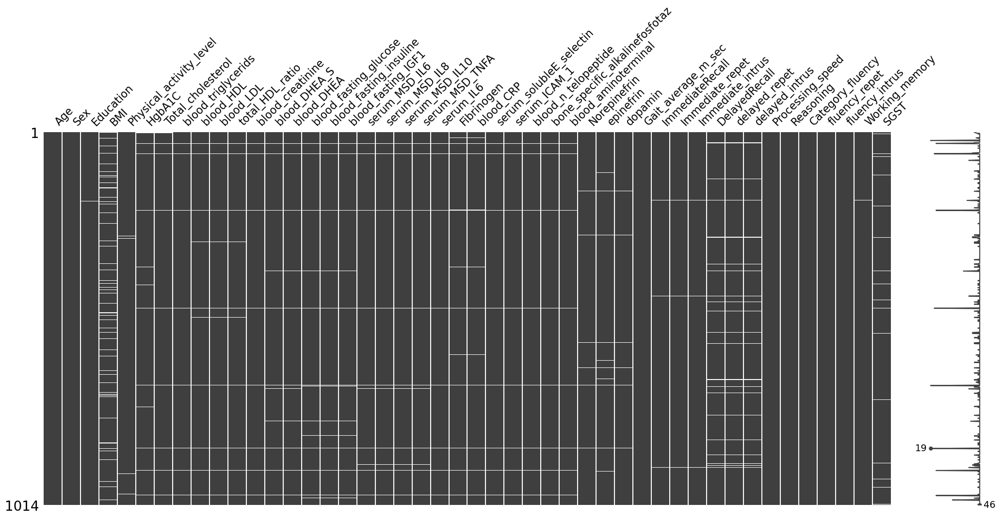

In [17]:
msno.matrix(train_df)

I will further drop the samples that have many missing values. (I dropped observations that contain more than 3 missing features)

In [18]:
train_df['number_of_NaNs'] = train_df.isna().sum(1)
rows_to_drop = train_df.loc[train_df['number_of_NaNs']>= 3]


In [19]:
indexes_drop = rows_to_drop.index
train_df = train_df.drop(indexes_drop, axis=0)


In [20]:
train_df = train_df.drop('number_of_NaNs', axis=1)


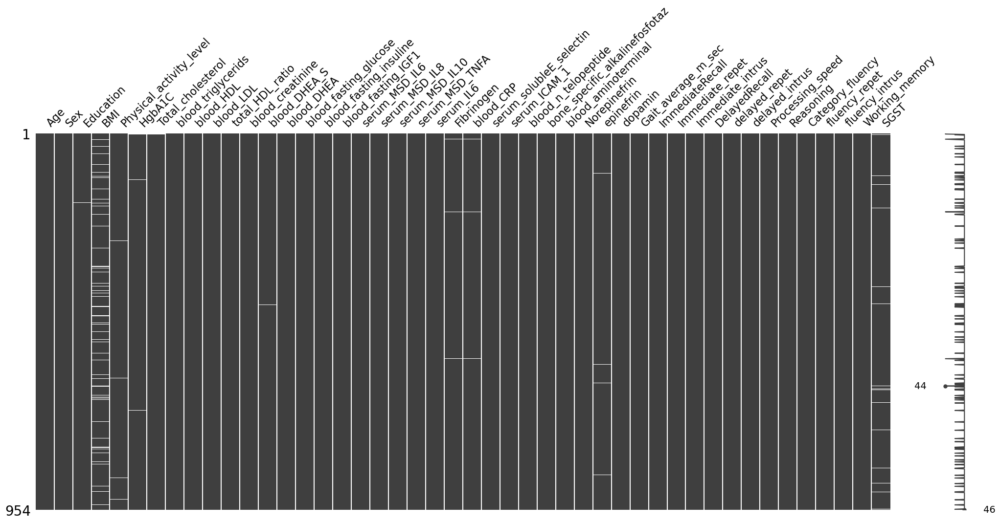

In [21]:
msno.matrix(train_df)
plt.show()

This is the final data that I will start data analysis. 

We have 954 samples. There are still some missing values. But I will impute them.

Let's repear descriptive statistics with clean data.

In [22]:
#numerical feature descriptive statistics
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,954.0,46.349057,11.825097,25.000000,37.00000,46.000000,55.000000,74.000000
Education,953.0,7.554040,2.445513,2.000000,5.00000,8.000000,9.000000,12.000000
BMI,891.0,26.473798,4.992021,9.440000,22.86100,25.827000,29.250000,54.489000
Physical_activity_level,949.0,1393.383087,2103.315218,0.000000,176.00000,720.000000,1746.000000,17329.500000
HgbA1C,949.0,5.978475,0.848561,3.800000,5.59780,5.800000,6.115400,13.400000
Total_cholesterol,952.0,186.154412,38.436974,91.000000,160.00000,184.000000,211.000000,339.000000
blood_triglycerids,954.0,130.653040,79.782628,25.000000,78.00000,108.000000,158.750000,765.000000
blood_HDL,954.0,54.213836,17.294935,19.000000,41.25000,52.000000,64.000000,121.000000
blood_LDL,954.0,106.063941,34.479538,16.000000,81.00000,102.000000,128.000000,239.000000
total_HDL_ratio,954.0,3.758291,1.383742,1.340000,2.75000,3.505000,4.500000,10.110000


A clear observation is that there are some strong outliers on target varaible Gait_average_m_sec. Let's make a visualization.

<Axes: xlabel='Gait_average_m_sec', ylabel='Count'>

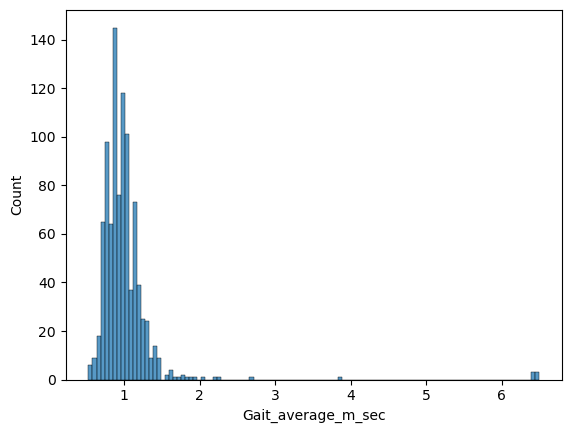

In [23]:
 sns.histplot(x='Gait_average_m_sec',  data=train_df )

There are definetely outliers at higher end. These observations may severely affect machine learning model performance. Let's have a closer look to that samples.

In [24]:
gait_avarage_outliers = train_df.loc[train_df['Gait_average_m_sec']>= 2]

gait_avarage_outliers.style.background_gradient('Reds')

,Age,Sex,Education,BMI,Physical_activity_level,HgbA1C,Total_cholesterol,blood_triglycerids,blood_HDL,blood_LDL,total_HDL_ratio,blood_creatinine,blood_DHEA_S,blood_DHEA,blood_fasting_glucose,blood_fasting_insuline,blood_fasting_IGF1,serum_MSD_IL6,serum_MSD_IL8,serum_MSD_IL10,serum_MSD_TNFA,serum_IL6,Fibrinogen,blood_CRP,serum_solubleE_selectin,serum_ICAM_1,blood_n_telopeptide,bone_specific_alkalinefosfotaz,blood_aminoterminal,Norepinefrin,epinefrin,dopamin,Gait_average_m_sec,ImmediateRecall,Immediate_repet,Immediate_intrus,DelayedRecall,delayed_repet,delayed_intrus,Processing_speed,Reasoning,Category_fluency,fluency_repet,fluency_intrus,Working_memory,SGST
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
10678,58,2,6.000000,38.669000,540.000000,6.368600,234.000000,154.000000,45.000000,158.000000,5.200000,0.500000,42.000000,10.700000,107.000000,17.000000,86.000000,0.820000,14.460000,0.200000,2.050000,2.200000,378.000000,3.380000,39.660000,412.660000,29.430000,77.340000,58.000000,0.750000,0.060000,5.500000,6.430446,6.000000,0.000000,3.000000,6.000000,0.000000,3.000000,42.000000,1.000000,17.000000,0.000000,0.000000,4.000000,0.982000
12380,71,2,8.000000,23.322000,264.000000,6.300000,185.000000,80.000000,81.000000,88.000000,2.280000,1.000000,10.000000,0.400000,106.000000,10.000000,134.000000,1.220000,25.180000,0.210000,2.140000,2.660000,352.000000,1.870000,13.770000,316.890000,7.450000,30.480000,9.740000,8.300000,0.190000,14.100000,2.657480,7.000000,0.000000,0.000000,6.000000,0.000000,3.000000,33.000000,1.000000,11.000000,1.000000,0.000000,4.000000,0.917000
14283,42,2,12.000000,25.012000,906.000000,6.000000,191.000000,68.000000,66.000000,111.000000,2.890000,0.700000,118.000000,4.400000,96.000000,11.000000,282.000000,3.670000,9.250000,0.300000,2.190000,9.040000,417.000000,2.860000,37.100000,299.820000,17.610000,45.410000,105.590000,0.850000,0.060000,7.100000,6.430446,11.000000,0.000000,0.000000,8.000000,0.000000,0.000000,50.000000,5.000000,37.000000,1.000000,0.000000,6.000000,0.789000
14737,59,1,9.000000,25.827000,0.000000,6.600000,147.000000,187.000000,42.000000,68.000000,3.500000,1.100000,50.000000,3.500000,116.000000,13.000000,93.000000,1.460000,9.500000,0.230000,2.170000,2.330000,271.000000,1.410000,50.560000,378.240000,10.200000,22.760000,27.120000,2.600000,0.200000,10.800000,2.263780,7.000000,0.000000,1.000000,3.000000,0.000000,1.000000,25.000000,3.000000,17.000000,0.000000,0.000000,5.000000,1.184000
15944,67,1,5.000000,33.499000,0.000000,6.500000,177.000000,99.000000,66.000000,91.000000,2.680000,1.000000,106.000000,3.000000,115.000000,7.000000,156.000000,7.160000,19.500000,0.570000,4.640000,9.600000,557.000000,61.700000,57.720000,296.970000,15.300000,25.270000,72.550000,2.600000,0.180000,45.000000,6.496063,4.000000,0.000000,1.000000,2.000000,0.000000,3.000000,37.000000,3.000000,15.000000,0.000000,0.000000,2.000000,1.138000
16412,55,2,6.000000,nan,0.000000,6.100000,216.000000,358.000000,33.000000,111.000000,6.550000,0.600000,40.000000,3.000000,121.000000,52.000000,118.000000,1.860000,17.810000,0.200000,0.450000,4.390000,398.000000,3.080000,42.640000,324.310000,14.910000,24.110000,93.060000,3.100000,0.080000,7.000000,6.496063,4.000000,0.000000,0.000000,2.000000,0.000000,1.000000,29.000000,2.000000,16.000000,0.000000,0.000000,4.000000,nan
16705,55,2,10.000000,nan,0.000000,5.800000,227.000000,91.000000,47.000000,162.000000,4.830000,0.900000,77.000000,6.200000,89.000000,4.000000,109.000000,0.990000,15.260000,0.410000,3.310000,2.240000,282.000000,5.610000,70.600000,352.450000,7.340000,17.470000,25.230000,0.640000,0.020000,2.200000,2.066929,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,26.000000,0.000000,8.000000,0.000000,0.000000,3.000000,6.322000
17400,42,2,11.000000,31.137000,462.500000,6.200000,169.000000,84.000000,74.000000,78.000000,2.280000,0.600000,31.000000,7.200000,92.000000,9.000000,168.000000,1.290000,11.790000,0.210000,1.730000,2.190000,410.000000,1.020000,54.700000,228.280000,7.570000,30.890000,74.080000,0.51000

Some of these samples contains largest values on specific columns. I noted them below. 

* 14283: reasoning 5.000000
* 15944: dopamin 45, blood_CRP 61.700000
* 16705: SGST 6.322000
* 17400: Working memory 8
* 17647: Working memory 8, dopamin 45 
* 18679: reasoning 5.000000

Here I will drop these samples. Note that this is an important decision since this decision will affect machine learning models performance significantly. If you think these are valid samples we may need to reconsider.


In [25]:
indexes_drop = gait_avarage_outliers.index
train_df = train_df.drop(indexes_drop, axis=0)

<Axes: xlabel='Gait_average_m_sec', ylabel='Count'>

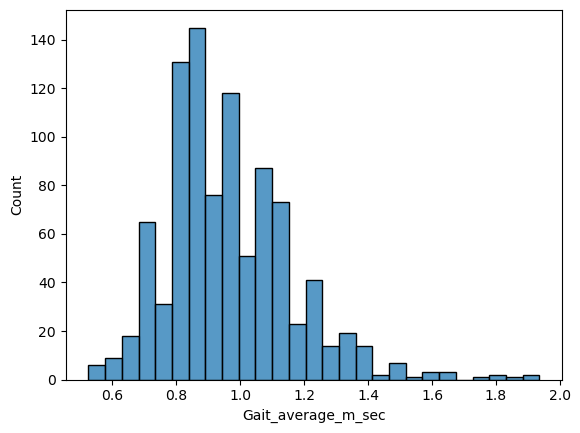

In [26]:
 sns.histplot(x='Gait_average_m_sec',  data=train_df )

In [27]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 943 entries, 10005 to 19193
Data columns (total 46 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Age                             943 non-null    int64   
 1   Sex                             943 non-null    category
 2   Education                       942 non-null    float64 
 3   BMI                             883 non-null    float64 
 4   Physical_activity_level         938 non-null    float64 
 5   HgbA1C                          938 non-null    float64 
 6   Total_cholesterol               941 non-null    float64 
 7   blood_triglycerids              943 non-null    float64 
 8   blood_HDL                       943 non-null    float64 
 9   blood_LDL                       943 non-null    float64 
 10  total_HDL_ratio                 943 non-null    float64 
 11  blood_creatinine                943 non-null    float64 
 12  blood_DHEA_S    

This is the final data that we have. I will continue analysis with 943 samples that include some missing values. 

<a id = "4"></a><br>
# Exploratory Data Analysis

## Grouping features for preprocessing purposes

Different data types will require different preprocessing techniques. Here, I will group features for bookkeeping and preprocessing purposes.

In [28]:
train_df.nunique().sort_values()

Sex                                 2
fluency_repet                       4
fluency_intrus                      5
Immediate_repet                     5
delayed_repet                       5
Reasoning                           6
Immediate_intrus                    7
Working_memory                      8
delayed_intrus                     10
Education                          11
ImmediateRecall                    13
DelayedRecall                      15
blood_creatinine                   18
Category_fluency                   35
Gait_average_m_sec                 40
Age                                49
blood_fasting_insuline             57
Processing_speed                   62
epinefrin                          77
blood_HDL                          86
blood_fasting_glucose              98
serum_MSD_IL10                    100
HgbA1C                            106
Norepinefrin                      134
blood_LDL                         161
Total_cholesterol                 180
blood_DHEA  

In [29]:
# Just bookkeeping
feature_list = [feature for feature in train_df.columns if not feature  == "Gait_average_m_sec"]
categorical_features = [feature for feature in train_df.columns if 
                        train_df[feature].dtype == "category"] 
numerical_features = [feature for feature in train_df.columns if 
                      feature not in categorical_features + ['Gait_average_m_sec']]

discrete_features = ['fluency_repet', 'fluency_intrus','Immediate_repet','delayed_repet','Reasoning','Immediate_intrus','Working_memory']

continuous_features = list(set(numerical_features) - set(discrete_features))

assert feature_list.sort() == (categorical_features + numerical_features).sort()
assert numerical_features.sort() == (continuous_features + discrete_features).sort()


Let's observe feature distributions.

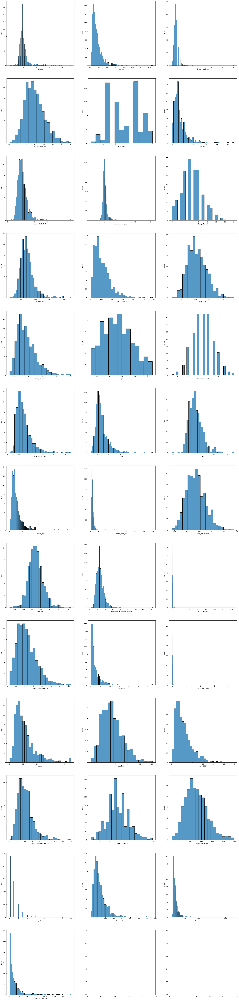

In [30]:
fig, ax = plt.subplots(13, 3, figsize=(30, 130))
for var, subplot in zip(continuous_features, ax.flatten()):
    sns.histplot(x=var,  data=train_df, ax=subplot )

There are some heavy outliers. Let's drop them.

In [31]:
train_df = train_df.drop(train_df[train_df['serum_MSD_IL10'] > 10].index)
train_df = train_df.drop(train_df[train_df['serum_MSD_IL8'] > 150].index)
train_df = train_df.drop(train_df[train_df['serum_MSD_IL6'] > 20].index)



Visualize again..

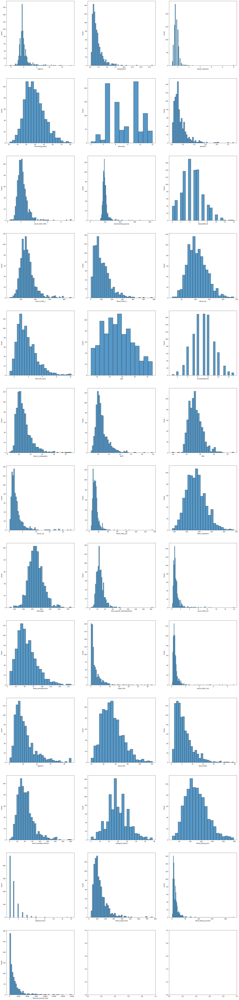

In [32]:
fig, ax = plt.subplots(13, 3, figsize=(30, 130))
for var, subplot in zip(continuous_features, ax.flatten()):
    sns.histplot(x=var,  data=train_df, ax=subplot )

There are many skewed features. Linear models are severely affected by skewness. Let's identify them. Later, we will deal with them in a pipeline.

In [33]:
#identify skewed features
skewnes = train_df[continuous_features].skew().sort_values(ascending=False)
skewnes = pd.DataFrame({'Skew' : skewnes})
skewnes.style.background_gradient('rocket')

,Skew
blood_creatinine,8.957063
blood_fasting_insuline,7.140728
serum_MSD_IL10,6.953146
serum_MSD_IL8,6.081385
blood_fasting_glucose,5.709202
serum_MSD_IL6,5.346925
blood_CRP,4.171327
serum_IL6,3.671232
HgbA1C,3.485527
Physical_activity_level,3.456477


In [34]:
skewed_features = skewnes[skewnes['Skew'] > 1].index.values.tolist()
skewed_features

['blood_creatinine',
 'blood_fasting_insuline',
 'serum_MSD_IL10',
 'serum_MSD_IL8',
 'blood_fasting_glucose',
 'serum_MSD_IL6',
 'blood_CRP',
 'serum_IL6',
 'HgbA1C',
 'Physical_activity_level',
 'delayed_intrus',
 'bone_specific_alkalinefosfotaz',
 'Norepinefrin',
 'serum_MSD_TNFA',
 'epinefrin',
 'blood_triglycerids',
 'SGST',
 'blood_n_telopeptide',
 'dopamin',
 'blood_DHEA',
 'serum_ICAM_1',
 'blood_DHEA_S',
 'serum_solubleE_selectin',
 'total_HDL_ratio',
 'blood_aminoterminal']

Let's observe how target variable changes with features.

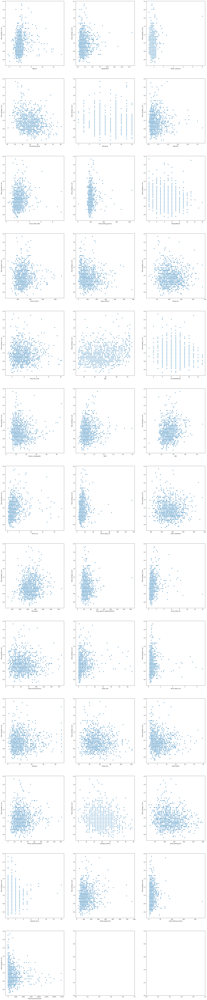

In [35]:
fig, ax = plt.subplots(13, 3, figsize=(30, 150))
for var, subplot in zip(continuous_features, ax.flatten()):
    sns.scatterplot(x=var, y='Gait_average_m_sec',  data=train_df, ax=subplot )
    

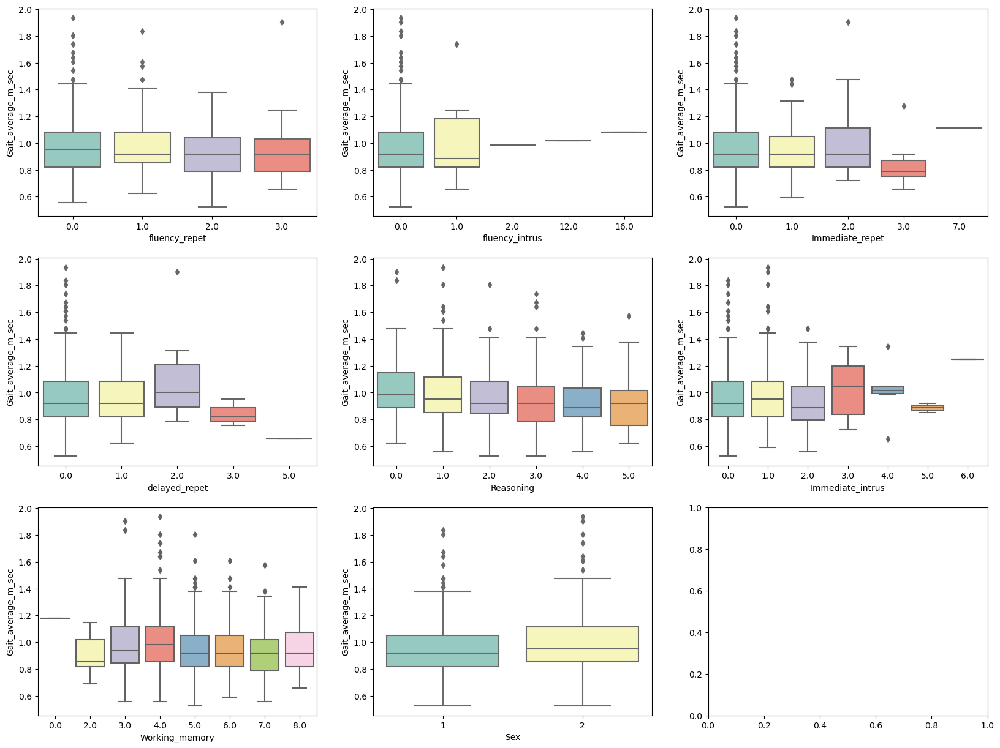

In [36]:
fig, ax = plt.subplots(3, 3, figsize=(20, 15))
for var, subplot in zip(discrete_features + categorical_features, ax.flatten()):
    sns.boxplot(x=var, y='Gait_average_m_sec',  data=train_df, ax=subplot, palette='Set3')

There is no strong relation between features and target accorsing to plots we have.

Let's look at relation between features and the target with a more quantitative way..

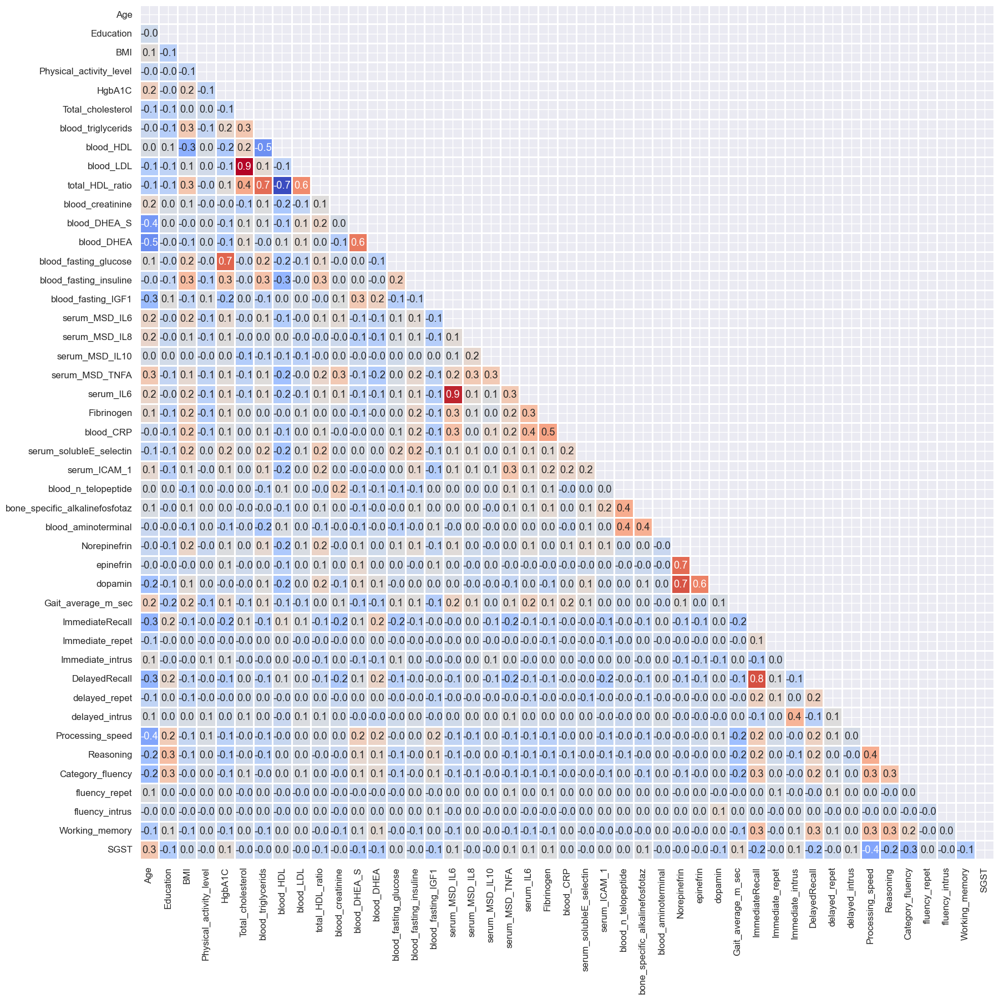

In [37]:
# Display correlations between numerical features and gate_average on heatmap.

sns.set(font_scale=1.1)
correlation_train = train_df.corr()
mask = np.triu(correlation_train.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_train,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False);

There some week correlation between gate_avarage and features. A sign that we will not get a very good model...

Mutual information score is another statistical measure for relationships. Let's also check mutual information score.

In [38]:
y = train_df.Gait_average_m_sec

In [39]:

# determine the mutual information for numerical features
#You need to fillna to get results from mutual_info_regression function
mutual_df = train_df[numerical_features]

mutual_info = mutual_info_regression(mutual_df.fillna(mutual_df.mean()), y, random_state=random_state)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df.columns
mutual_info = pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Numerical_Feature_MI"] )
mutual_info.style.background_gradient("cool")

,Numerical_Feature_MI
Processing_speed,0.093265
Reasoning,0.056232
blood_fasting_insuline,0.055719
blood_DHEA,0.050129
Education,0.046452
SGST,0.045412
serum_ICAM_1,0.043384
blood_HDL,0.039705
serum_IL6,0.036799
blood_n_telopeptide,0.034573


In [40]:
no_info_cols = mutual_info[mutual_info['Numerical_Feature_MI'] < 0.00001].index.values.tolist()
no_info_cols

['blood_triglycerids',
 'delayed_intrus',
 'delayed_repet',
 'dopamin',
 'epinefrin',
 'blood_creatinine',
 'BMI',
 'Working_memory',
 'Norepinefrin',
 'serum_MSD_IL10',
 'Immediate_repet',
 'serum_MSD_IL8',
 'serum_MSD_TNFA',
 'serum_solubleE_selectin',
 'blood_aminoterminal']

In [41]:
#Dropping no info columns generally helps. But did not help here.
#train_df = train_df.drop(no_info_cols, axis=1)

Mutual information also work with preprocessed categorical variables. 

In [42]:
mutual_df_categorical = train_df[categorical_features]
#categorical features must be encoded to get mutual information
for colname in mutual_df_categorical:
    mutual_df_categorical[colname], _ = mutual_df_categorical[colname].factorize()
mutual_info = mutual_info_regression(mutual_df_categorical, y, random_state=1)

mutual_info = pd.Series(mutual_info)
mutual_info.index = mutual_df_categorical.columns
pd.DataFrame(mutual_info.sort_values(ascending=False), columns = ["Categorical_Feature_MI"] ).style.background_gradient("cool")


,Categorical_Feature_MI
Sex,0.046588


<a id = "4"></a><br>
# Preprocessing

Up to now we try to understand the data set. Before modelling we need to preprocess the data. For preprocessing I will use pipelines. Pipelines are great for the following reasons:

* They help to avoid any data leakage in stateful transformations which could eventually lead to overfitting. 
* There is no need for manual tracking of preprocessing steps in train and test sets

Here, I will construct building blocks of preprocessing steps in a pipeline according to the following decisions:

#### Missing data handling:

* Impute missing values mean of the columns (I also tried median imputation. Mean performed better.)

#### Categorical data processing:

* Use one-hot encoding for Sex column

#### Numerical data processing:
* For linear models and support vector machines scale the features, and apply additional power transformation for skewed features. (power transformation is kept limited with continuous features)

* For tree-based models do not use any scaling since they do not require


#### Target varaible processing:
* For linear models and support vector machines use log transformation for target varaible since target is fairly skewed. (TransformedTargetRegressor is very helpful)



## Preprocessor for linear models

In [43]:
# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
       
    ('imputer', SimpleImputer(strategy='mean')),
    ('Scaller', StandardScaler()),    
    
])


In [44]:
# Preprocessing for categorical data

categorical_transformer = OneHotEncoder(handle_unknown='ignore')

In [45]:
# Preprocessing for skew features

skewness_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('PowerTransformer', PowerTransformer( method='yeo-johnson', standardize=True)), 
])

In [46]:
# Bundle preprocessing for linear algorithms
linear_preprocessor = ColumnTransformer(remainder=numerical_transformer,
    transformers=[
        ('skewness_transformer', skewness_transformer, skewed_features),
        ('categorical_transformer', categorical_transformer, categorical_features),
    ])

linear_preprocessor

ColumnTransformer(remainder=Pipeline(steps=[('imputer', SimpleImputer()),
                                            ('Scaller', StandardScaler())]),
                  transformers=[('skewness_transformer',
                                 Pipeline(steps=[('imputer', SimpleImputer()),
                                                 ('PowerTransformer',
                                                  PowerTransformer())]),
                                 ['blood_creatinine', 'blood_fasting_insuline',
                                  'serum_MSD_IL10', 'serum_MSD_IL8',
                                  'blood_fasting_glucose', 'serum_MSD_IL6',
                                  'bloo...
                                  'Physical_activity_level', 'delayed_intrus',
                                  'bone_specific_alkalinefosfotaz',
                                  'Norepinefrin', 'serum_MSD_TNFA', 'epinefrin',
                                  'blood_triglycerids', 'SGST',
                                  'blood_n_telopeptide', 'dopamin',
                                  'blood_DHEA', 'serum_ICAM_1', 'blood_DHEA_S',
                                  'serum_solubleE_selectin', 'total_HDL_ratio',
                                  'blood_aminoterminal']),
                                ('categorical_transformer',
                                 OneHotEncoder(handle_unknown='ignore'),
                                 ['Sex'])])

## Preprocessor for tree-based models

In [47]:
tree_preprocessor = ColumnTransformer(#remainder='passthrough',
    transformers=[
        ('imputer', SimpleImputer(strategy='mean'), numerical_features),
        ('categorical_transformer', categorical_transformer, categorical_features),

    ])

tree_preprocessor

ColumnTransformer(transformers=[('imputer', SimpleImputer(),
                                 ['Age', 'BMI', 'Category_fluency',
                                  'DelayedRecall', 'Education', 'Fibrinogen',
                                  'HgbA1C', 'ImmediateRecall',
                                  'Immediate_intrus', 'Immediate_repet',
                                  'Norepinefrin', 'Physical_activity_level',
                                  'Processing_speed', 'Reasoning', 'SGST',
                                  'Total_cholesterol', 'Working_memory',
                                  'blood_CRP', 'blood_DHEA', 'blood_DHEA_S',
                                  'blood_HDL', 'blood_LDL',
                                  'blood_aminoterminal', 'blood_creatinine',
                                  'blood_fasting_IGF1', 'blood_fasting_glucose',
                                  'blood_fasting_insuline',
                                  'blood_n_telopeptide', 'blood_triglycerids',
                                  'bone_specific_alkalinefosfotaz', ...]),
                                ('categorical_transformer',
                                 OneHotEncoder(handle_unknown='ignore'),
                                 ['Sex'])])

<a id = "4"></a><br>
# Modeling and hyperparameter tuning

%80 of the data is used for training, and 10-fold cross-validation is performed. %20 percent of the data is reserved as a test set for model evaluation. 

Models are tunned for mean_absolute_error score. R2 (coefficient of determination) is also reported.

In [48]:
y = train_df['Gait_average_m_sec']
train_df = train_df.drop(['Gait_average_m_sec'], axis=1)

In [49]:
X_train, X_test, y_train, y_test = train_test_split(train_df, y, 
                                                    test_size=0.2,
                                                    random_state=random_state,
                                                    shuffle=True)


print(X_train.shape, X_test.shape)

(750, 45) (188, 45)


<a id = "4"></a><br>
## Try Lasso Regression

I will also use Optuna package for hyperparameter tuning. It uses Bayesian optimization to optimize the hyperparameters. 

In [50]:
import optuna
from optuna.samplers import TPESampler
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice

I will start with a simple model. Lasso is linear regression model with L1 regularization.

In [51]:
def objective(trial):


    max_iter = trial.suggest_int("max_iter", 1000, 4000)
    alpha =  trial.suggest_float("alpha", 1e-4, 1000, log=True) 
    tol =  trial.suggest_float("tol", 1e-6, 1e-3, log=True)
     

    
    Lasso_regressor = Lasso(max_iter=max_iter, alpha=alpha,tol=tol, random_state =1)
   
    # -- Make a pipeline
    Lasso_pipeline = make_pipeline(linear_preprocessor, Lasso_regressor)
    
    Lasso_model = TransformedTargetRegressor(regressor=Lasso_pipeline, func=np.log1p, inverse_func=np.expm1)
    
    ss = ShuffleSplit(n_splits=10, test_size=0.1, random_state=random_state) #ShuffleSplit will help you to keep distributions of training data and folds similar)
    score = cross_val_score(Lasso_model, X_train, y_train, scoring= make_scorer(mean_absolute_error),  cv=ss)
    score = score.mean()
    return score


sampler = TPESampler(seed=random_state) # create a seed for the sampler for reproducibility
study = optuna.create_study(direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=100)

[I 2023-12-21 01:04:49,447] A new study created in memory with name: no-name-d4c56b41-9d59-4eb9-bd72-65e050aa47f1
[I 2023-12-21 01:04:50,188] Trial 0 finished with value: 0.15003104897823805 and parameters: {'max_iter': 2123, 'alpha': 451.85609510240965, 'tol': 0.000157029708840554}. Best is trial 0 with value: 0.15003104897823805.
[I 2023-12-21 01:04:50,948] Trial 1 finished with value: 0.13905729595092012 and parameters: {'max_iter': 2796, 'alpha': 0.0012363188277052211, 'tol': 2.9375384576328313e-06}. Best is trial 1 with value: 0.13905729595092012.
[I 2023-12-21 01:04:51,708] Trial 2 finished with value: 0.15003104897823805 and parameters: {'max_iter': 1174, 'alpha': 115.67327199145953, 'tol': 6.358358856676247e-05}. Best is trial 1 with value: 0.13905729595092012.
[I 2023-12-21 01:04:52,454] Trial 3 finished with value: 0.14063199549853805 and parameters: {'max_iter': 3124, 'alpha': 0.000139345022513376, 'tol': 0.0008123245085588687}. Best is trial 1 with value: 0.1390572959509201

[I 2023-12-21 01:05:15,041] Trial 36 finished with value: 0.14477496015813676 and parameters: {'max_iter': 3237, 'alpha': 0.017820360011889785, 'tol': 2.844637570945206e-06}. Best is trial 23 with value: 0.13770036947502592.
[I 2023-12-21 01:05:15,606] Trial 37 finished with value: 0.13919882006881656 and parameters: {'max_iter': 2572, 'alpha': 0.0071378874701336845, 'tol': 4.0187488201804144e-06}. Best is trial 23 with value: 0.13770036947502592.
[I 2023-12-21 01:05:16,187] Trial 38 finished with value: 0.14608367653299895 and parameters: {'max_iter': 3372, 'alpha': 0.01997825174485147, 'tol': 1.3685666309716952e-06}. Best is trial 23 with value: 0.13770036947502592.
[I 2023-12-21 01:05:16,718] Trial 39 finished with value: 0.13758666510843381 and parameters: {'max_iter': 2200, 'alpha': 0.0037745126940787093, 'tol': 3.196939396193506e-06}. Best is trial 39 with value: 0.13758666510843381.
[I 2023-12-21 01:05:17,370] Trial 40 finished with value: 0.1406888251305151 and parameters: {'ma

[I 2023-12-21 01:05:37,864] Trial 73 finished with value: 0.1379215403093386 and parameters: {'max_iter': 2580, 'alpha': 0.004249945934997288, 'tol': 4.196254540092684e-06}. Best is trial 39 with value: 0.13758666510843381.
[I 2023-12-21 01:05:38,463] Trial 74 finished with value: 0.14128027465199264 and parameters: {'max_iter': 2951, 'alpha': 0.011256819349936827, 'tol': 4.807657536536341e-06}. Best is trial 39 with value: 0.13758666510843381.
[I 2023-12-21 01:05:39,126] Trial 75 finished with value: 0.13878842358043503 and parameters: {'max_iter': 2487, 'alpha': 0.0018809638480910586, 'tol': 3.991353895590557e-06}. Best is trial 39 with value: 0.13758666510843381.
[I 2023-12-21 01:05:39,808] Trial 76 finished with value: 0.1395759122521149 and parameters: {'max_iter': 1618, 'alpha': 0.0007526771831078583, 'tol': 5.613430148388009e-06}. Best is trial 39 with value: 0.13758666510843381.
[I 2023-12-21 01:05:40,477] Trial 77 finished with value: 0.1390282282861997 and parameters: {'max_i

In [52]:
plot_optimization_history(study)

In [53]:
lasso_optuna_params = {'max_iter': 2200, 'alpha': 0.0037745126940787093, 'tol': 3.196939396193506e-06}
lasso_tunned = Lasso(**lasso_optuna_params, random_state=random_state)

pipe_Lasso = Pipeline(steps=[
                       
            ('linear_preprocessor', linear_preprocessor),
            ('regressor6', lasso_tunned),
    
                     ])


TargetTransformedLasso = TransformedTargetRegressor(regressor=pipe_Lasso, func=np.log1p, inverse_func=np.expm1)

In [54]:
lasso_regressor = TargetTransformedLasso.fit(X_train, y_train)

In [55]:
y_pred = lasso_regressor.predict(X_test)

In [56]:
print(mean_squared_error(y_test, y_pred))
print(mean_absolute_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

0.026365063527069067
0.12949224985342603
0.19733902224320432


In [57]:
#pip install yellowbrick

Visualize y_true vs y_predicted and residuals.

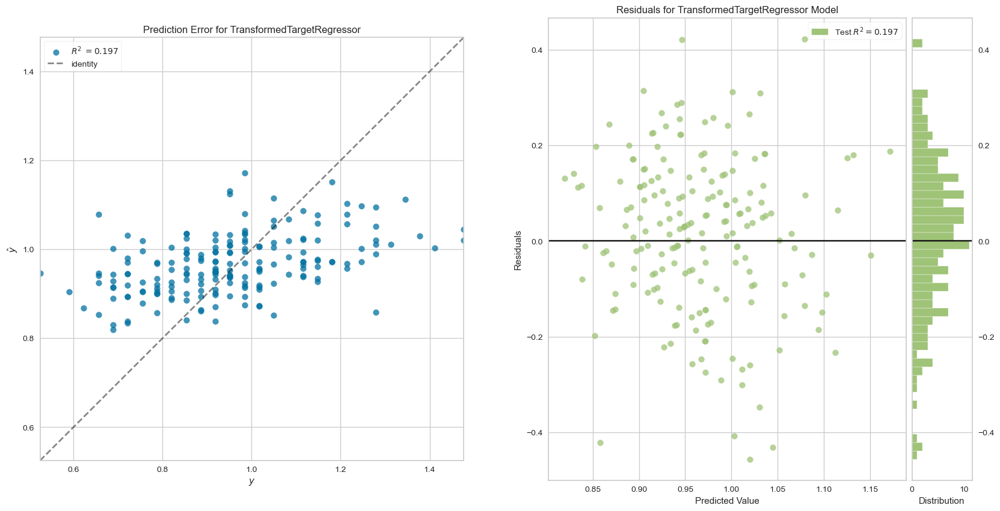

In [58]:
from yellowbrick.features import FeatureImportances
from yellowbrick.regressor import ResidualsPlot, PredictionError

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

model = lasso_regressor
visualgrid = [
    PredictionError(model, bestfit=False, ax=axes[0]),
    ResidualsPlot(model, ax=axes[1]),
]

for viz in visualgrid:
    viz.score(X_test, y_test)
    viz.finalize()

plt.show()


<a id = "4"></a><br>
## Try XGBoost

In [59]:
def objective(trial):

    n_estimators = trial.suggest_int("n_estimators", 10,500)
    # L1 regularization weight.
    alpha = trial.suggest_float("alpha", 1e-8, 1.0, log=True)
    # sampling ratio for training data.
    subsample = trial.suggest_float("subsample", 0.2, 1.0)
    # sampling according to each tree.
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.2, 0.8)
    # maximum depth of the tree, signifies complexity of the tree.
    max_depth = trial.suggest_int("max_depth", 3, 12)
    # minimum child weight, larger the term more conservative the tree.
    min_child_weight = trial.suggest_int("min_child_weight", 1, 3)
    # learning rate
    learning_rate =  trial.suggest_float("learning_rate", 1e-4, 1, log=True)
    # defines how selective algorithm is.
    gamma = trial.suggest_float("gamma", 1e-8, 1.0, log=True)
       

    xgb_regressor = XGBRegressor(n_estimators = n_estimators,alpha=alpha,subsample=subsample,colsample_bytree=colsample_bytree,
                           max_depth=max_depth,min_child_weight =min_child_weight,learning_rate=learning_rate,gamma=gamma,eval_metric = 'mae',
                           random_state =random_state)
   
        
    xgb_pipeline = make_pipeline(tree_preprocessor, xgb_regressor)
    
    ss = ShuffleSplit(n_splits=10, test_size=0.1, random_state=random_state) #ShuffleSplit will help you to keep distributions of training data and folds similar)
    score = cross_val_score(xgb_pipeline, X_train, y_train, scoring= make_scorer(mean_absolute_error),  cv=ss)
    score = score.mean()
    return score


sampler = TPESampler(seed=random_state) # create a seed for the sampler for reproducibility
study = optuna.create_study(direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=100)

[I 2023-12-21 01:05:54,920] A new study created in memory with name: no-name-cd509c53-5c6f-4a95-831b-be67b3825b09
[I 2023-12-21 01:05:56,634] Trial 0 finished with value: 0.4334363189559653 and parameters: {'n_estimators': 193, 'alpha': 0.40338008326003827, 'subsample': 0.7855951534491241, 'colsample_bytree': 0.559195090518222, 'max_depth': 4, 'min_child_weight': 1, 'learning_rate': 0.0001707396743152812, 'gamma': 0.08499808989182997}. Best is trial 0 with value: 0.4334363189559653.
[I 2023-12-21 01:06:00,022] Trial 1 finished with value: 0.3837540808923404 and parameters: {'n_estimators': 305, 'alpha': 0.004619347374377372, 'subsample': 0.21646759543664196, 'colsample_bytree': 0.7819459112971967, 'max_depth': 11, 'min_child_weight': 1, 'learning_rate': 0.000533703276260396, 'gamma': 2.9324868872723725e-07}. Best is trial 1 with value: 0.3837540808923404.
[I 2023-12-21 01:06:01,798] Trial 2 finished with value: 0.35671669944060325 and parameters: {'n_estimators': 159, 'alpha': 0.000157

[I 2023-12-21 01:07:50,421] Trial 22 finished with value: 0.1354941547652701 and parameters: {'n_estimators': 262, 'alpha': 1.5186822819930669e-06, 'subsample': 0.47761908304360146, 'colsample_bytree': 0.7226115814893321, 'max_depth': 12, 'min_child_weight': 3, 'learning_rate': 0.014091760842579971, 'gamma': 0.09320659239208454}. Best is trial 22 with value: 0.1354941547652701.
[I 2023-12-21 01:07:57,532] Trial 23 finished with value: 0.1421141000076061 and parameters: {'n_estimators': 437, 'alpha': 1.4348289859358103e-06, 'subsample': 0.46412523230186453, 'colsample_bytree': 0.72717620394982, 'max_depth': 11, 'min_child_weight': 2, 'learning_rate': 0.0037481972718826765, 'gamma': 0.19372814418202153}. Best is trial 22 with value: 0.1354941547652701.
[I 2023-12-21 01:08:03,683] Trial 24 finished with value: 0.1422860779570165 and parameters: {'n_estimators': 340, 'alpha': 6.534818729828951e-08, 'subsample': 0.6213294329757244, 'colsample_bytree': 0.7984818970885843, 'max_depth': 9, 'mi

[I 2023-12-21 01:09:18,551] Trial 44 finished with value: 0.1350813859855356 and parameters: {'n_estimators': 324, 'alpha': 4.226300436304785e-08, 'subsample': 0.6716770401936892, 'colsample_bytree': 0.542132742461988, 'max_depth': 8, 'min_child_weight': 3, 'learning_rate': 0.00982015379750876, 'gamma': 0.07974382371858894}. Best is trial 44 with value: 0.1350813859855356.
[I 2023-12-21 01:09:22,567] Trial 45 finished with value: 0.1343825011049038 and parameters: {'n_estimators': 318, 'alpha': 3.737362058635428e-08, 'subsample': 0.6777370503838901, 'colsample_bytree': 0.5413279166885445, 'max_depth': 8, 'min_child_weight': 3, 'learning_rate': 0.009244875646906476, 'gamma': 0.29965904469650967}. Best is trial 45 with value: 0.1343825011049038.
[I 2023-12-21 01:09:27,143] Trial 46 finished with value: 0.1685939062443202 and parameters: {'n_estimators': 304, 'alpha': 3.522674593109749e-08, 'subsample': 0.6752260904412306, 'colsample_bytree': 0.5256600197062611, 'max_depth': 8, 'min_child

[I 2023-12-21 01:10:53,861] Trial 66 finished with value: 0.1714938885624758 and parameters: {'n_estimators': 487, 'alpha': 1.809833990389891e-08, 'subsample': 0.8946761636765156, 'colsample_bytree': 0.43816029178750865, 'max_depth': 6, 'min_child_weight': 3, 'learning_rate': 0.0022130767426517947, 'gamma': 0.9491721949662411}. Best is trial 63 with value: 0.13432536900905442.
[I 2023-12-21 01:10:58,061] Trial 67 finished with value: 0.1483044350899426 and parameters: {'n_estimators': 458, 'alpha': 3.990119663238291e-08, 'subsample': 0.9032036098270677, 'colsample_bytree': 0.4580071815330383, 'max_depth': 6, 'min_child_weight': 3, 'learning_rate': 0.0031737653035075843, 'gamma': 0.13570407251889324}. Best is trial 63 with value: 0.13432536900905442.
[I 2023-12-21 01:11:03,846] Trial 68 finished with value: 0.13800710669380623 and parameters: {'n_estimators': 499, 'alpha': 2.4758214139178188e-08, 'subsample': 0.8243679487331139, 'colsample_bytree': 0.43424377577280915, 'max_depth': 6, '

[I 2023-12-21 01:12:43,121] Trial 88 finished with value: 0.13626538268550017 and parameters: {'n_estimators': 430, 'alpha': 6.233027716492289e-08, 'subsample': 0.7878599081035593, 'colsample_bytree': 0.5139295054161744, 'max_depth': 6, 'min_child_weight': 3, 'learning_rate': 0.011329317395137286, 'gamma': 0.20868083262585274}. Best is trial 74 with value: 0.1340750411668133.
[I 2023-12-21 01:12:46,147] Trial 89 finished with value: 0.2071949912934102 and parameters: {'n_estimators': 243, 'alpha': 3.862038683019049e-08, 'subsample': 0.8376254320441169, 'colsample_bytree': 0.4388339179256393, 'max_depth': 8, 'min_child_weight': 3, 'learning_rate': 0.0034406002551733684, 'gamma': 0.026216582777958013}. Best is trial 74 with value: 0.1340750411668133.
[I 2023-12-21 01:12:51,455] Trial 90 finished with value: 0.13445361793154836 and parameters: {'n_estimators': 450, 'alpha': 1.1044971466213699e-07, 'subsample': 0.8753292407103885, 'colsample_bytree': 0.5687008541868536, 'max_depth': 7, 'mi

In [60]:
plot_optimization_history(study)


In [61]:
xgb_optuna_params = {'n_estimators': 477,
                     'alpha': 2.9194103692830294e-08,
                     'subsample': 0.7766466494145843,
                     'colsample_bytree': 0.4925947764903254,
                     'max_depth': 7,
                     'min_child_weight': 3,
                     'learning_rate': 0.0053782437374451314,
                     'gamma': 0.10907481497487259}

xgb_tunned = XGBRegressor(**xgb_optuna_params, random_state=random_state)

pipe_xgb = Pipeline(steps=[
                        
                       ('tree_preprocessor', tree_preprocessor),
                       ('regressor', xgb_tunned),
                     ])
pipe_xgb

Pipeline(steps=[('tree_preprocessor',
                 ColumnTransformer(transformers=[('imputer', SimpleImputer(),
                                                  ['Age', 'BMI',
                                                   'Category_fluency',
                                                   'DelayedRecall', 'Education',
                                                   'Fibrinogen', 'HgbA1C',
                                                   'ImmediateRecall',
                                                   'Immediate_intrus',
                                                   'Immediate_repet',
                                                   'Norepinefrin',
                                                   'Physical_activity_level',
                                                   'Processing_speed',
                                                   'Reasoning', 'SGST',
                                                   'Total_cholesterol',
                                                   'Working_memory',
                                                   '...
                              gpu_id=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None,
                              learning_rate=0.0053782437374451314, max_bin=None,
                              max_cat_threshold=None, max_cat_to_onehot=None,
                              max_delta_step=None, max_depth=7, max_leaves=None,
                              min_child_weight=3, missing=nan,
                              monotone_constraints=None, n_estimators=477,
                              n_jobs=None, num_parallel_tree=None,
                              predictor=None, ...))])

In [62]:
xgb_regressor = pipe_xgb.fit(X_train, y_train)

In [63]:
y_pred = xgb_regressor.predict(X_test)
print(mean_squared_error(y_test, y_pred))
print(mean_absolute_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

0.025473593248869195
0.12630170190175338
0.22447904428056364


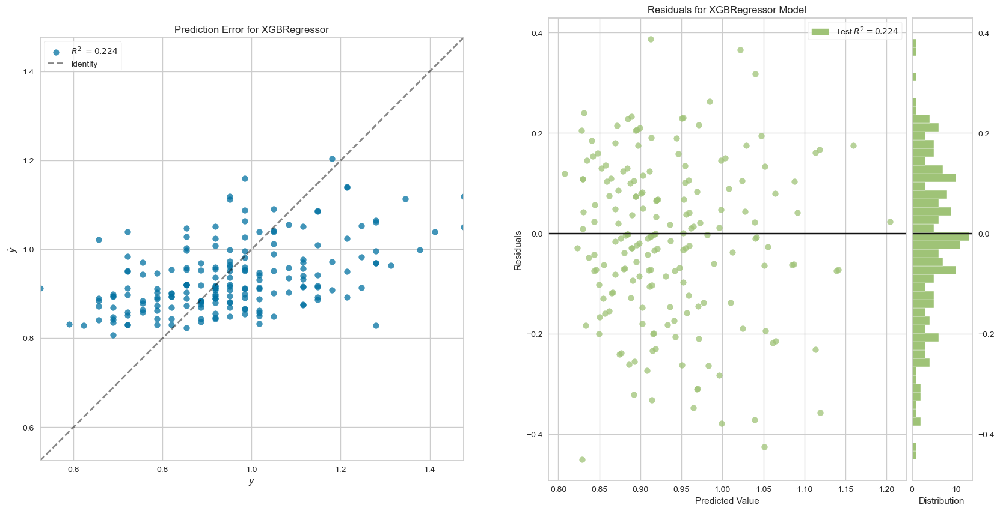

In [64]:
from yellowbrick.features import FeatureImportances
from yellowbrick.regressor import ResidualsPlot, PredictionError

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

model = xgb_regressor
visualgrid = [
    PredictionError(model, bestfit=False, ax=axes[0]),
    ResidualsPlot(model, ax=axes[1]),
]

for viz in visualgrid:
    viz.score(X_test, y_test)
    viz.finalize()

plt.show()

<a id = "4"></a><br>
## Try LightGBM

In [65]:
def objective(trial):


    n_estimators = trial.suggest_int("n_estimators", 10,500)
    max_depth = trial.suggest_int("max_depth", 2, 14)
    learning_rate =  trial.suggest_float("learning_rate", 1e-4, 0.1, log=True)
    subsample = trial.suggest_float("subsample", 0.2, 1.0, step=0.05)        
    max_bin = trial.suggest_int("max_bin", 200, 350, step=10),
    feature_fraction = trial.suggest_float("feature_fraction", 0.3, 1.0, step=0.1)


    
    

    lgbm_regressor = LGBMRegressor(n_estimators = n_estimators,max_depth=max_depth,learning_rate=learning_rate,
                                         subsample=subsample,max_bin=max_bin,feature_fraction=feature_fraction, random_state =random_state, verbose=-1)
   
    # -- Make a pipeline
    lgbm_pipeline = make_pipeline(tree_preprocessor, lgbm_regressor)

    
    ss = ShuffleSplit(n_splits=10, test_size=0.1, random_state=random_state) #ShuffleSplit will help you to keep distributions of training data and folds similar)
    score = cross_val_score(lgbm_pipeline, X_train, y_train, scoring= make_scorer(mean_absolute_error),  cv=ss)
    score = score.mean()
    return score


sampler = TPESampler(seed=42) # create a seed for the sampler for reproducibility
study = optuna.create_study(direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=100)
    

[I 2023-12-21 01:13:37,760] A new study created in memory with name: no-name-e46c61fd-b445-45b6-b4f2-0cb7737ebc49
  File "C:\Users\Public\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 199, in _count_physical_cores
    cpu_info = subprocess.run(
               ^^^^^^^^^^^^^^^
  File "C:\Users\Public\anaconda3\Lib\subprocess.py", line 548, in run
    with Popen(*popenargs, **kwargs) as process:
         ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\Public\anaconda3\Lib\subprocess.py", line 1026, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\Public\anaconda3\Lib\subprocess.py", line 1538, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,
                       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
[I 2023-12-21 01:13:39,418] Trial 0 finished with value: 0.13516944183468502 and parameters: {'n_estimators': 193, 'max_depth': 14, 'learning_rate': 0.015702970884055395, 'subsample': 0.

[I 2023-12-21 01:14:15,792] Trial 26 finished with value: 0.13821631029426465 and parameters: {'n_estimators': 156, 'max_depth': 8, 'learning_rate': 0.0077392633735705214, 'subsample': 1.0, 'max_bin': 230, 'feature_fraction': 0.6000000000000001}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:14:16,526] Trial 27 finished with value: 0.1362864972271037 and parameters: {'n_estimators': 133, 'max_depth': 5, 'learning_rate': 0.05337149075209393, 'subsample': 0.9000000000000001, 'max_bin': 250, 'feature_fraction': 0.5}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:14:17,237] Trial 28 finished with value: 0.13539819580586623 and parameters: {'n_estimators': 207, 'max_depth': 3, 'learning_rate': 0.02106285355628629, 'subsample': 0.8, 'max_bin': 270, 'feature_fraction': 0.8}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:14:17,955] Trial 29 finished with value: 0.13848336400677225 and parameters: {'n_estimators': 75, 'max_depth': 8

[I 2023-12-21 01:15:16,663] Trial 55 finished with value: 0.13579920783457064 and parameters: {'n_estimators': 398, 'max_depth': 9, 'learning_rate': 0.01991118332371566, 'subsample': 0.95, 'max_bin': 300, 'feature_fraction': 0.3}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:15:20,267] Trial 56 finished with value: 0.1345134428530816 and parameters: {'n_estimators': 481, 'max_depth': 8, 'learning_rate': 0.013957834080101846, 'subsample': 1.0, 'max_bin': 290, 'feature_fraction': 0.3}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:15:22,382] Trial 57 finished with value: 0.13678340348407167 and parameters: {'n_estimators': 497, 'max_depth': 7, 'learning_rate': 0.025979222254636544, 'subsample': 0.8500000000000001, 'max_bin': 320, 'feature_fraction': 0.3}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:15:24,649] Trial 58 finished with value: 0.13766769246933264 and parameters: {'n_estimators': 470, 'max_depth': 8, 'learning_r

[I 2023-12-21 01:16:26,334] Trial 84 finished with value: 0.13480942706037355 and parameters: {'n_estimators': 479, 'max_depth': 6, 'learning_rate': 0.006588433056460969, 'subsample': 1.0, 'max_bin': 230, 'feature_fraction': 0.7}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:16:29,213] Trial 85 finished with value: 0.13531368143657518 and parameters: {'n_estimators': 353, 'max_depth': 14, 'learning_rate': 0.015028873306783442, 'subsample': 0.95, 'max_bin': 250, 'feature_fraction': 0.8}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:16:30,709] Trial 86 finished with value: 0.13534221254168943 and parameters: {'n_estimators': 195, 'max_depth': 11, 'learning_rate': 0.012269572399730888, 'subsample': 0.55, 'max_bin': 240, 'feature_fraction': 0.4}. Best is trial 21 with value: 0.13434275705322554.
[I 2023-12-21 01:16:32,744] Trial 87 finished with value: 0.1354438542742006 and parameters: {'n_estimators': 330, 'max_depth': 8, 'learning_rate': 0.008

In [66]:
plot_optimization_history(study)

In [67]:
lgbm_optuna_params =  {'n_estimators': 156,
                       'max_depth': 7,
                       'learning_rate': 0.023984142236256105,
                       'subsample': 0.8500000000000001,
                       'max_bin': 260,
                       'feature_fraction': 0.5}

lgbm_tunned = LGBMRegressor(**lgbm_optuna_params, random_state=random_state, verbose=-1)

pipe_lgbm = Pipeline(steps=[
                        
                       ('tree_preprocessor', tree_preprocessor),
                       ('lgbm_tunned', lgbm_tunned),
                     ])
pipe_lgbm

Pipeline(steps=[('tree_preprocessor',
                 ColumnTransformer(transformers=[('imputer', SimpleImputer(),
                                                  ['Age', 'BMI',
                                                   'Category_fluency',
                                                   'DelayedRecall', 'Education',
                                                   'Fibrinogen', 'HgbA1C',
                                                   'ImmediateRecall',
                                                   'Immediate_intrus',
                                                   'Immediate_repet',
                                                   'Norepinefrin',
                                                   'Physical_activity_level',
                                                   'Processing_speed',
                                                   'Reasoning', 'SGST',
                                                   'Total_cholesterol',
                                                   'Working_memory',
                                                   '...
                                                   'blood_fasting_insuline',
                                                   'blood_n_telopeptide',
                                                   'blood_triglycerids',
                                                   'bone_specific_alkalinefosfotaz', ...]),
                                                 ('categorical_transformer',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Sex'])])),
                ('lgbm_tunned',
                 LGBMRegressor(feature_fraction=0.5,
                               learning_rate=0.023984142236256105, max_bin=260,
                               max_depth=7, n_estimators=156, random_state=42,
                               subsample=0.8500000000000001, verbose=-1))])

In [68]:
lgbm_regressor = pipe_lgbm.fit(X_train, y_train)

In [69]:
y_pred = lgbm_regressor.predict(X_test)
print(mean_squared_error(y_test, y_pred))
print(mean_absolute_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

0.026173433957691825
0.12980423501118837
0.20317301454007597


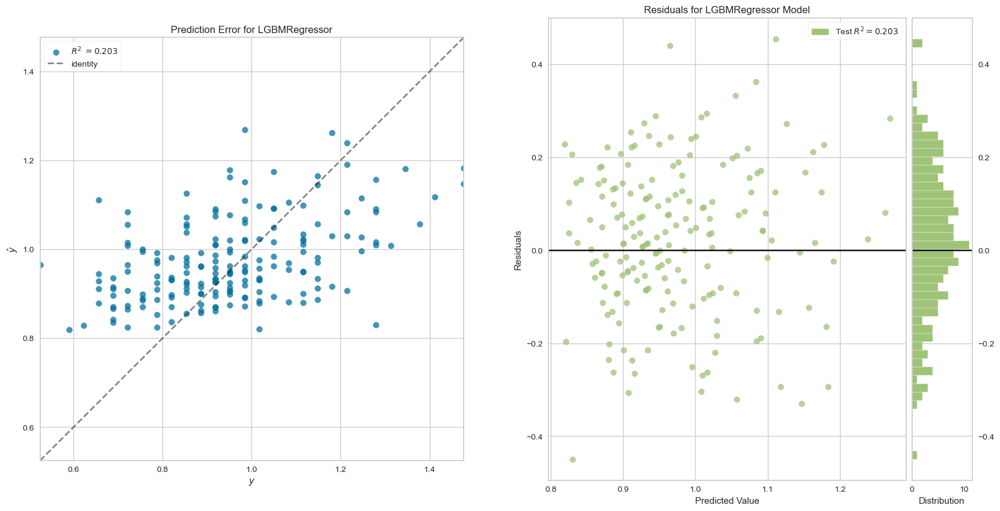

In [70]:
from yellowbrick.features import FeatureImportances
from yellowbrick.regressor import ResidualsPlot, PredictionError

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

model = lgbm_regressor
visualgrid = [
    PredictionError(model, bestfit=False, ax=axes[0]),
    ResidualsPlot(model, ax=axes[1]),
]

for viz in visualgrid:
    viz.score(X_test, y_test)
    viz.finalize()

plt.show()

<a id = "4"></a><br>
## Try CatBoost

In [71]:

def objective(trial):

    cat_param = {
        "iterations" : trial.suggest_int("iterations", 10,500),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.3, 0.8),
        "learning_rate": trial.suggest_float("learning_rate",1e-3, 1e-2, log=True),
        "random_strength": trial.suggest_float("random_strength",1e-2, 1, log=True),
        
        "depth": trial.suggest_int("depth", 2, 12),
        "l2_leaf_reg": trial.suggest_int("l2_leaf_reg", 1, 8),

        "boosting_type": trial.suggest_categorical("boosting_type", ["Plain"]),
        "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bernoulli"])
    }

    if cat_param["bootstrap_type"] == "Bayesian":
        cat_param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif cat_param["bootstrap_type"] == "Bernoulli":
        cat_param["subsample"] = trial.suggest_float("subsample", 0.3, 0.8)
    

    

    catboost_regressor = CatBoostRegressor(**cat_param,random_state =random_state, logging_level='Silent')

    # -- Make a pipeline
    catboost_pipeline = make_pipeline( tree_preprocessor, catboost_regressor)

    
    ss = ShuffleSplit(n_splits=10, test_size=0.1, random_state=random_state) #ShuffleSplit will help you to keep distributions of training data and folds similar)
    score = cross_val_score(catboost_pipeline, X_train, y_train, scoring= make_scorer(mean_absolute_error),  cv=ss)
    score = score.mean()
    return score


sampler = TPESampler(seed=random_state) # create a seed for the sampler for reproducibility
study = optuna.create_study(direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=100)

[I 2023-12-21 01:17:06,638] A new study created in memory with name: no-name-49982742-fb08-4f76-a665-8a962817909b
[I 2023-12-21 01:17:09,505] Trial 0 finished with value: 0.14447011843096308 and parameters: {'iterations': 193, 'colsample_bylevel': 0.7753571532049581, 'learning_rate': 0.00539503096667023, 'random_strength': 0.15751320499779725, 'depth': 3, 'l2_leaf_reg': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.3290418060840997}. Best is trial 0 with value: 0.14447011843096308.
[I 2023-12-21 01:25:18,296] Trial 1 finished with value: 0.14773671586940942 and parameters: {'iterations': 435, 'colsample_bylevel': 0.6005575058716044, 'learning_rate': 0.005105903209394756, 'random_strength': 0.010994335574766204, 'depth': 12, 'l2_leaf_reg': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.40616955533913807}. Best is trial 0 with value: 0.14447011843096308.
[I 2023-12-21 01:25:21,406] Trial 2 finished with value: 0.14922592759593056 a

[I 2023-12-21 01:30:08,103] Trial 20 finished with value: 0.13951859454471527 and parameters: {'iterations': 455, 'colsample_bylevel': 0.4875548729218111, 'learning_rate': 0.007629195199746266, 'random_strength': 0.036497335177648624, 'depth': 8, 'l2_leaf_reg': 7, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5107614299187315}. Best is trial 13 with value: 0.13725417159011838.
[I 2023-12-21 01:30:15,930] Trial 21 finished with value: 0.13823910842799442 and parameters: {'iterations': 492, 'colsample_bylevel': 0.552016933467679, 'learning_rate': 0.007837700054755745, 'random_strength': 0.06289111532007967, 'depth': 4, 'l2_leaf_reg': 6, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.5004831188261247}. Best is trial 13 with value: 0.13725417159011838.
[I 2023-12-21 01:30:26,184] Trial 22 finished with value: 0.13846945558853757 and parameters: {'iterations': 498, 'colsample_bylevel': 0.5051102112946549, 'learning_rate': 0.0063880390546545

[I 2023-12-21 01:33:32,376] Trial 41 finished with value: 0.13875861592413002 and parameters: {'iterations': 351, 'colsample_bylevel': 0.3694028291836602, 'learning_rate': 0.00979841875040702, 'random_strength': 0.016307073723195578, 'depth': 6, 'l2_leaf_reg': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.30505162740183855}. Best is trial 13 with value: 0.13725417159011838.
[I 2023-12-21 01:33:41,500] Trial 42 finished with value: 0.13801516288880625 and parameters: {'iterations': 442, 'colsample_bylevel': 0.4582284629003903, 'learning_rate': 0.008145208920182835, 'random_strength': 0.022483299226132274, 'depth': 5, 'l2_leaf_reg': 5, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.40909257499850127}. Best is trial 13 with value: 0.13725417159011838.
[I 2023-12-21 01:33:52,127] Trial 43 finished with value: 0.13829355114879 and parameters: {'iterations': 405, 'colsample_bylevel': 0.3296829070812016, 'learning_rate': 0.0088168707551139

[I 2023-12-21 01:48:25,200] Trial 62 finished with value: 0.13839113074178605 and parameters: {'iterations': 411, 'colsample_bylevel': 0.3571047430979032, 'learning_rate': 0.007344432515230045, 'random_strength': 0.01170610985655413, 'depth': 8, 'l2_leaf_reg': 1, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.3033072611077955}. Best is trial 13 with value: 0.13725417159011838.
[I 2023-12-21 01:49:08,869] Trial 63 finished with value: 0.13815198492608255 and parameters: {'iterations': 448, 'colsample_bylevel': 0.31180736676454707, 'learning_rate': 0.008144480619141277, 'random_strength': 0.017016542403356077, 'depth': 9, 'l2_leaf_reg': 1, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.3467531395126797}. Best is trial 13 with value: 0.13725417159011838.
[I 2023-12-21 01:49:20,418] Trial 64 finished with value: 0.1382639647431135 and parameters: {'iterations': 320, 'colsample_bylevel': 0.32394968856342576, 'learning_rate': 0.00929108659945

[I 2023-12-21 01:55:49,221] Trial 83 finished with value: 0.13819493182920534 and parameters: {'iterations': 375, 'colsample_bylevel': 0.35597430273468467, 'learning_rate': 0.0076172889850948736, 'random_strength': 0.013702696019565308, 'depth': 5, 'l2_leaf_reg': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.33437991087276486}. Best is trial 73 with value: 0.1371953486424547.
[I 2023-12-21 01:55:54,367] Trial 84 finished with value: 0.1382707120710007 and parameters: {'iterations': 359, 'colsample_bylevel': 0.3350949213980083, 'learning_rate': 0.008768482700699083, 'random_strength': 0.01948468612224818, 'depth': 4, 'l2_leaf_reg': 2, 'boosting_type': 'Plain', 'bootstrap_type': 'Bernoulli', 'subsample': 0.41016419235421775}. Best is trial 73 with value: 0.1371953486424547.
[I 2023-12-21 01:56:02,605] Trial 85 finished with value: 0.13731829374027946 and parameters: {'iterations': 470, 'colsample_bylevel': 0.3004332502910332, 'learning_rate': 0.00927567209513

In [72]:
plot_optimization_history(study)

In [73]:
catb_optuna_params =  {'iterations': 472,
                       'colsample_bylevel': 0.33105340987045,
                       'learning_rate': 0.009619069791176167,
                       'random_strength': 0.014543955938935147,
                       'depth': 8,
                       'l2_leaf_reg': 2,
                       'boosting_type': 'Plain',
                       'bootstrap_type': 'Bernoulli',
                       'subsample': 0.30785849645974817}

catb_tunned = CatBoostRegressor(**catb_optuna_params, random_state=random_state, logging_level='Silent')

pipe_catb = Pipeline(steps=[
                        
                       ('tree_preprocessor', tree_preprocessor),
                       ('catb_tunned', catb_tunned),
                     ])
pipe_catb

Pipeline(steps=[('tree_preprocessor',
                 ColumnTransformer(transformers=[('imputer', SimpleImputer(),
                                                  ['Age', 'BMI',
                                                   'Category_fluency',
                                                   'DelayedRecall', 'Education',
                                                   'Fibrinogen', 'HgbA1C',
                                                   'ImmediateRecall',
                                                   'Immediate_intrus',
                                                   'Immediate_repet',
                                                   'Norepinefrin',
                                                   'Physical_activity_level',
                                                   'Processing_speed',
                                                   'Reasoning', 'SGST',
                                                   'Total_cholesterol',
                                                   'Working_memory',
                                                   '...
                                                   'blood_LDL',
                                                   'blood_aminoterminal',
                                                   'blood_creatinine',
                                                   'blood_fasting_IGF1',
                                                   'blood_fasting_glucose',
                                                   'blood_fasting_insuline',
                                                   'blood_n_telopeptide',
                                                   'blood_triglycerids',
                                                   'bone_specific_alkalinefosfotaz', ...]),
                                                 ('categorical_transformer',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Sex'])])),
                ('catb_tunned',
                 <catboost.core.CatBoostRegressor object at 0x0000027197C88A50>)])

In [74]:
catb_regressor = pipe_catb.fit(X_train, y_train)

In [75]:
y_pred = catb_regressor.predict(X_test)
print(mean_squared_error(y_test, y_pred))
print(mean_absolute_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

0.026195015085274866
0.12952632814200124
0.20251599624959804


<a id = "4"></a><br>
## Try GradientBoosting

In [76]:
def objective(trial):


    n_estimators = trial.suggest_int("n_estimators", 50, 500)
    min_samples_leaf = trial.suggest_int("min_samples_leaf", 1, 40, step=3)
    max_depth = trial.suggest_int("max_depth", 2, 16, step=2)
    learning_rate =  trial.suggest_float("learning_rate", 1e-4, 0.1, log=True)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    max_features = trial.suggest_categorical("max_features", [ "sqrt", "log2"])        
    

    gbm_regressor = GradientBoostingRegressor(n_estimators = n_estimators,min_samples_leaf=min_samples_leaf,max_depth=max_depth,
                                        learning_rate=learning_rate, subsample=subsample, max_features = max_features, random_state =random_state)
   
    # -- Make a pipeline
    gbm_pipeline = make_pipeline(tree_preprocessor, gbm_regressor)

    
    ss = ShuffleSplit(n_splits=10, test_size=0.1, random_state=0) #ShuffleSplit will help you to keep distributions of training data and folds similar)
    score = cross_val_score(gbm_pipeline, X_train, y_train, scoring= make_scorer(mean_absolute_error),  cv=ss)
    score = score.mean()
    return score


sampler = TPESampler(seed=42) # create a seed for the sampler for reproducibility
study = optuna.create_study(direction="minimize", sampler=sampler)
study.optimize(objective, n_trials=100)
    

[I 2023-12-21 02:01:37,249] A new study created in memory with name: no-name-b188b541-d231-421b-8108-9ae80380e9e1
[I 2023-12-21 02:01:39,366] Trial 0 finished with value: 0.14713783032166222 and parameters: {'n_estimators': 218, 'min_samples_leaf': 40, 'max_depth': 12, 'learning_rate': 0.006251373574521752, 'subsample': 0.5780093202212182, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.14713783032166222.
[I 2023-12-21 02:01:47,715] Trial 1 finished with value: 0.15474574879578443 and parameters: {'n_estimators': 440, 'min_samples_leaf': 25, 'max_depth': 12, 'learning_rate': 0.00011527987128232407, 'subsample': 0.9849549260809971, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.14713783032166222.
[I 2023-12-21 02:01:49,819] Trial 2 finished with value: 0.14976955220294635 and parameters: {'n_estimators': 132, 'min_samples_leaf': 7, 'max_depth': 6, 'learning_rate': 0.0037520558551242854, 'subsample': 0.7159725093210578, 'max_features': 'log2'}. Best is trial 0 with value: 

[I 2023-12-21 02:03:28,939] Trial 27 finished with value: 0.1462906925256203 and parameters: {'n_estimators': 270, 'min_samples_leaf': 28, 'max_depth': 12, 'learning_rate': 0.015446861807790879, 'subsample': 0.8482713074691624, 'max_features': 'sqrt'}. Best is trial 11 with value: 0.1455216997212111.
[I 2023-12-21 02:03:34,417] Trial 28 finished with value: 0.14629255286038254 and parameters: {'n_estimators': 347, 'min_samples_leaf': 22, 'max_depth': 14, 'learning_rate': 0.004227895651150219, 'subsample': 0.7473059377190023, 'max_features': 'sqrt'}. Best is trial 11 with value: 0.1455216997212111.
[I 2023-12-21 02:03:47,370] Trial 29 finished with value: 0.14728101753421347 and parameters: {'n_estimators': 466, 'min_samples_leaf': 1, 'max_depth': 10, 'learning_rate': 0.0074669454414098115, 'subsample': 0.637985807967397, 'max_features': 'sqrt'}. Best is trial 11 with value: 0.1455216997212111.
[I 2023-12-21 02:03:50,394] Trial 30 finished with value: 0.14667013369026044 and parameters:

[I 2023-12-21 02:06:15,911] Trial 55 finished with value: 0.14602150591862934 and parameters: {'n_estimators': 328, 'min_samples_leaf': 34, 'max_depth': 16, 'learning_rate': 0.005736632934414607, 'subsample': 0.8563101202098534, 'max_features': 'sqrt'}. Best is trial 45 with value: 0.1449042087901477.
[I 2023-12-21 02:06:19,585] Trial 56 finished with value: 0.1467641097717678 and parameters: {'n_estimators': 296, 'min_samples_leaf': 31, 'max_depth': 16, 'learning_rate': 0.004322707367166918, 'subsample': 0.8027468923005862, 'max_features': 'log2'}. Best is trial 45 with value: 0.1449042087901477.
[I 2023-12-21 02:06:24,094] Trial 57 finished with value: 0.14577647958835477 and parameters: {'n_estimators': 360, 'min_samples_leaf': 40, 'max_depth': 16, 'learning_rate': 0.007196912694126606, 'subsample': 0.8213467841458945, 'max_features': 'sqrt'}. Best is trial 45 with value: 0.1449042087901477.
[I 2023-12-21 02:06:30,725] Trial 58 finished with value: 0.14641899883537748 and parameters

[I 2023-12-21 02:09:08,630] Trial 83 finished with value: 0.14664333669147417 and parameters: {'n_estimators': 488, 'min_samples_leaf': 22, 'max_depth': 10, 'learning_rate': 0.008841084634484981, 'subsample': 0.8008124305326132, 'max_features': 'sqrt'}. Best is trial 45 with value: 0.1449042087901477.
[I 2023-12-21 02:09:14,032] Trial 84 finished with value: 0.14676738394531538 and parameters: {'n_estimators': 410, 'min_samples_leaf': 34, 'max_depth': 8, 'learning_rate': 0.014656843363090566, 'subsample': 0.7589524354825975, 'max_features': 'sqrt'}. Best is trial 45 with value: 0.1449042087901477.
[I 2023-12-21 02:09:20,250] Trial 85 finished with value: 0.14747774386393547 and parameters: {'n_estimators': 474, 'min_samples_leaf': 28, 'max_depth': 10, 'learning_rate': 0.012129056578989432, 'subsample': 0.7442692199660909, 'max_features': 'sqrt'}. Best is trial 45 with value: 0.1449042087901477.
[I 2023-12-21 02:09:26,572] Trial 86 finished with value: 0.14569149009937407 and parameters

In [77]:
plot_optimization_history(study)

In [78]:
gbm_optuna_params =  {'n_estimators': 302,
                      'min_samples_leaf': 37,
                      'max_depth': 12,
                      'learning_rate': 0.010971371944478274,
                      'subsample': 0.7643267077933468,
                      'max_features': 'log2'}

gbm_tunned = GradientBoostingRegressor(**gbm_optuna_params, random_state=random_state)

pipe_gbm = Pipeline(steps=[
                        
                       ('tree_preprocessor', tree_preprocessor),
                       ('gbm_tunned', gbm_tunned),
                     ])
pipe_gbm

Pipeline(steps=[('tree_preprocessor',
                 ColumnTransformer(transformers=[('imputer', SimpleImputer(),
                                                  ['Age', 'BMI',
                                                   'Category_fluency',
                                                   'DelayedRecall', 'Education',
                                                   'Fibrinogen', 'HgbA1C',
                                                   'ImmediateRecall',
                                                   'Immediate_intrus',
                                                   'Immediate_repet',
                                                   'Norepinefrin',
                                                   'Physical_activity_level',
                                                   'Processing_speed',
                                                   'Reasoning', 'SGST',
                                                   'Total_cholesterol',
                                                   'Working_memory',
                                                   '...
                                                   'blood_n_telopeptide',
                                                   'blood_triglycerids',
                                                   'bone_specific_alkalinefosfotaz', ...]),
                                                 ('categorical_transformer',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Sex'])])),
                ('gbm_tunned',
                 GradientBoostingRegressor(learning_rate=0.010971371944478274,
                                           max_depth=12, max_features='log2',
                                           min_samples_leaf=37,
                                           n_estimators=302, random_state=42,
                                           subsample=0.7643267077933468))])

In [79]:
gbm_regressor = pipe_gbm.fit(X_train, y_train)

In [80]:
y_pred = gbm_regressor.predict(X_test)
print(mean_squared_error(y_test, y_pred))
print(mean_absolute_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

0.025079579106425883
0.12665334061548444
0.236474455423755


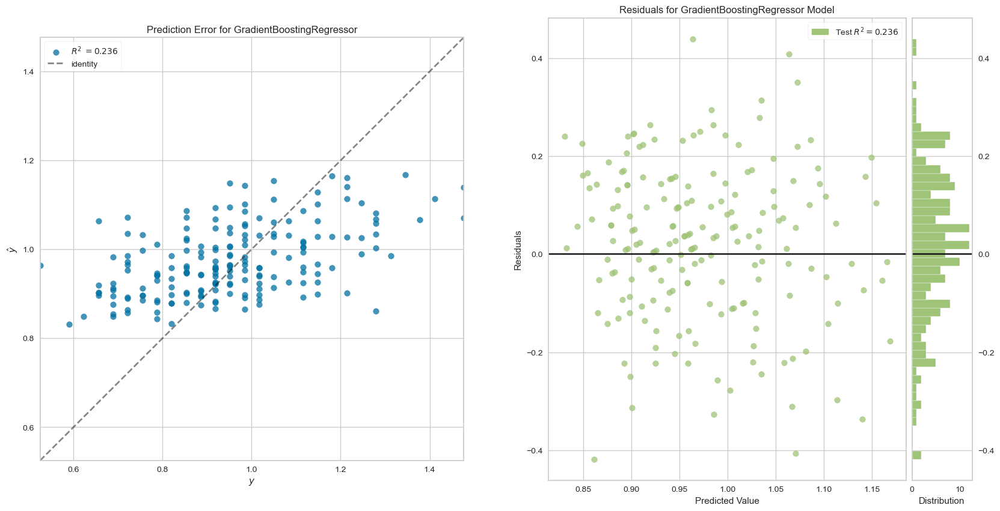

In [81]:
from yellowbrick.features import FeatureImportances
from yellowbrick.regressor import ResidualsPlot, PredictionError

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

model = gbm_regressor
visualgrid = [
    PredictionError(model, bestfit=False, ax=axes[0]),
    ResidualsPlot(model, ax=axes[1]),
]

for viz in visualgrid:
    viz.score(X_test, y_test)
    viz.finalize()

plt.show()

<a id = "14"></a><br>
# Stacking

Lastly, I will try stacking. Stacking takes out-of-fold predictions from base learners (regressors in our case) and feet it to a meta-learner to make a final prediction. Stacking models generally ends up with better performance than base models.

![ ]( https://miro.medium.com/max/1400/1*XsTcX5N6FXQW1bGhS9hxJQ.png )
reference- https://towardsdatascience.com/stacking-made-easy-with-sklearn-e27a0793c92b

In [82]:
xbg_param = {'n_estimators': 477,
             'alpha': 2.9194103692830294e-08,
             'subsample': 0.7766466494145843,
             'colsample_bytree': 0.4925947764903254,
             'max_depth': 7,
             'min_child_weight': 3,
             'learning_rate': 0.0053782437374451314,
             'gamma': 0.10907481497487259}


xgb_tunned = XGBRegressor(**xbg_param,
                          random_state =random_state)

pipe_xgb = Pipeline(steps=[
                        
                       ('tree_preprocessor', tree_preprocessor),
                       ('regressor1', xgb_tunned),
                     ])


gbm_param = {'n_estimators': 302,
                      'min_samples_leaf': 37,
                      'max_depth': 12,
                      'learning_rate': 0.010971371944478274,
                      'subsample': 0.7643267077933468,
                      'max_features': 'log2'}


gbm_tunned = GradientBoostingRegressor(**gbm_param, 
                                       random_state=random_state)


pipe_gbm = Pipeline(steps=[
                       
                       ('tree_preprocessor', tree_preprocessor),
                      ('regressor2', gbm_tunned),
                     ])


lgbm_param = {'n_estimators': 156,
              'max_depth': 7,
              'learning_rate': 0.023984142236256105,
              'subsample': 0.8500000000000001,
              'max_bin': 260,
              'feature_fraction': 0.5}


lgbm_tunned = LGBMRegressor(**lgbm_param, 
                            random_state =random_state,
                            verbosity= -1)

pipe_lgbm = Pipeline(steps=[
                       
                       ('tree_preprocessor', tree_preprocessor),
                      ('regressor3', lgbm_tunned),
                     ])

catb_param = {'iterations': 472,
              'colsample_bylevel': 0.33105340987045,
              'learning_rate': 0.009619069791176167,
              'random_strength': 0.014543955938935147,
              'depth': 8,
              'l2_leaf_reg': 2,
              'boosting_type': 'Plain',
              'bootstrap_type': 'Bernoulli',
              'subsample': 0.30785849645974817}

catboost_tunned = CatBoostRegressor(**catb_param, 
                                    logging_level = 'Silent', 
                                    random_state =random_state)


pipe_catboost = Pipeline(steps=[
                       ('tree_preprocessor', tree_preprocessor),
                      ('regressor4', catboost_tunned),
                     ])



lasso_param = {'max_iter': 2200, 'alpha': 0.0037745126940787093, 'tol': 3.196939396193506e-06}

lasso_tunned = Lasso(**lasso_param, 
                     random_state= random_state)

pipe_Lasso = Pipeline(steps=[
                       
                       ('linear_preprocessor', linear_preprocessor),
                      ('regressor6', lasso_tunned),
                     ])


TargetTransformedLasso = TransformedTargetRegressor(regressor=pipe_Lasso, func=np.log1p, inverse_func=np.expm1)





In [83]:
estimators = [
    ("pipe_xgb", pipe_xgb),
    ("pipe_gbm", pipe_gbm),
    ("pipe_lgbm", pipe_lgbm),
    ("pipe_catboost", pipe_catboost),
    ("TargetTransformedLasso", TargetTransformedLasso),
    
]

In [84]:
#pip install sklego

In [85]:
from sklego.linear_model import LADRegression

In [86]:
stacking_regressor = StackingRegressor(estimators=estimators, final_estimator= LADRegression())


In [87]:
stacking_regressor = stacking_regressor.fit(X_train, y_train)


In [88]:
y_pred = stacking_regressor.predict(X_test)
print(mean_squared_error(y_test, y_pred))
print(mean_absolute_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

0.02440483117376448
0.1237236084067851
0.2570165578470367


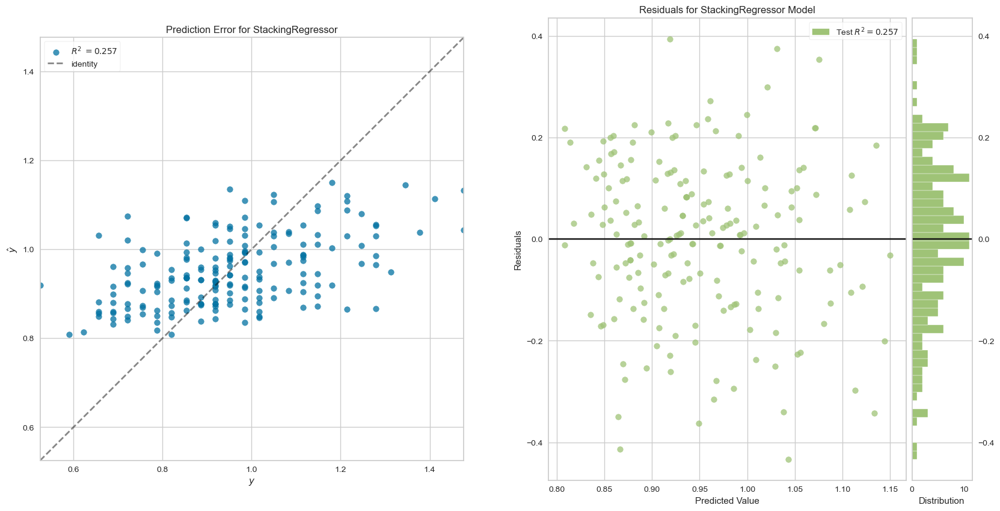

In [89]:
from yellowbrick.features import FeatureImportances
from yellowbrick.regressor import ResidualsPlot, PredictionError

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

model = stacking_regressor
visualgrid = [
    PredictionError(model, bestfit=False, ax=axes[0]),
    ResidualsPlot(model, ax=axes[1]),
]

for viz in visualgrid:
    viz.score(X_test, y_test)
    viz.finalize()

plt.show()

This is the best model I got. It has a 0.123 mean absolute error and 0.2570165578470367 R2 score. 

I tried pretty advanced tools, but correlations between gate_avarage and features were quite low. So, it didn't end up with a great model. 


<a id = "14"></a><br>
# Try AutoML

Lastly I will try Flaml. Flaml is an Auto-ML library. It tries different algorithms, tunes them, and returns the performing model.

In [90]:
#pip install flaml

In [91]:
from flaml import AutoML

In [92]:
automl = AutoML()

automl_pipeline = Pipeline([
    ('tree_preprocessor', tree_preprocessor),
    ("automl", automl)
])
automl_pipeline


Pipeline(steps=[('tree_preprocessor',
                 ColumnTransformer(transformers=[('imputer', SimpleImputer(),
                                                  ['Age', 'BMI',
                                                   'Category_fluency',
                                                   'DelayedRecall', 'Education',
                                                   'Fibrinogen', 'HgbA1C',
                                                   'ImmediateRecall',
                                                   'Immediate_intrus',
                                                   'Immediate_repet',
                                                   'Norepinefrin',
                                                   'Physical_activity_level',
                                                   'Processing_speed',
                                                   'Reasoning', 'SGST',
                                                   'Total_cholesterol',
                                                   'Working_memory',
                                                   '...
                        keep_search_state=False, learner_selector='sample',
                        log_file_name='', log_training_metric=False,
                        log_type='better', max_iter=None, mem_thres=4294967296,
                        metric='auto', metric_constraints=[],
                        min_sample_size=10000, mlflow_logging=True,
                        model_history=False, n_concurrent_trials=1, n_jobs=-1,
                        n_splits=5, pred_time_limit=inf,
                        preserve_checkpoint=True, retrain_full=True, ...))])

In [93]:
# Specify automl goal and constraint
automl_settings = {
    "time_budget": 600,  # total running time in seconds
    "task": 'regression',  # task type
    "seed": random_state,  # random seed
    "metric" : 'mae',
    "eval_method" : 'cv',
    "n_splits" : 5,
    "ensemble" : True,
        "ensemble": {
        "final_estimator": LADRegression(),
        "passthrough": True,
    },

    
}

In [94]:
pipeline_settings = {f"automl__{key}": value for key, value in automl_settings.items()}

In [95]:
automl_pipeline = automl_pipeline.fit(X_train, y_train, **pipeline_settings)


[flaml.automl.logger: 12-21 02:11:06] {1679} INFO - task = regression
[flaml.automl.logger: 12-21 02:11:06] {1690} INFO - Evaluation method: cv
[flaml.automl.logger: 12-21 02:11:06] {1788} INFO - Minimizing error metric: mae
[flaml.automl.logger: 12-21 02:11:06] {1900} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'catboost', 'xgboost', 'extra_tree', 'xgb_limitdepth']
[flaml.automl.logger: 12-21 02:11:06] {2218} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 12-21 02:11:06] {2344} INFO - Estimated sufficient time budget=598s. Estimated necessary time budget=5s.
[flaml.automl.logger: 12-21 02:11:06] {2391} INFO -  at 0.1s,	estimator lgbm's best error=0.1546,	best estimator lgbm's best error=0.1546
[flaml.automl.logger: 12-21 02:11:06] {2218} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 12-21 02:11:06] {2391} INFO -  at 0.2s,	estimator lgbm's best error=0.1546,	best estimator lgbm's best error=0.1546
[flaml.automl.logger: 12-21 02:11:06] {2218

[flaml.automl.logger: 12-21 02:11:09] {2218} INFO - iteration 34, current learner lgbm
[flaml.automl.logger: 12-21 02:11:09] {2391} INFO -  at 3.7s,	estimator lgbm's best error=0.1462,	best estimator lgbm's best error=0.1462
[flaml.automl.logger: 12-21 02:11:09] {2218} INFO - iteration 35, current learner xgboost
[flaml.automl.logger: 12-21 02:11:09] {2391} INFO -  at 3.7s,	estimator xgboost's best error=0.1464,	best estimator lgbm's best error=0.1462
[flaml.automl.logger: 12-21 02:11:09] {2218} INFO - iteration 36, current learner extra_tree
[flaml.automl.logger: 12-21 02:11:10] {2391} INFO -  at 3.9s,	estimator extra_tree's best error=0.1505,	best estimator lgbm's best error=0.1462
[flaml.automl.logger: 12-21 02:11:10] {2218} INFO - iteration 37, current learner xgboost
[flaml.automl.logger: 12-21 02:11:10] {2391} INFO -  at 4.0s,	estimator xgboost's best error=0.1464,	best estimator lgbm's best error=0.1462
[flaml.automl.logger: 12-21 02:11:10] {2218} INFO - iteration 38, current le

[flaml.automl.logger: 12-21 02:11:14] {2218} INFO - iteration 70, current learner xgboost
[flaml.automl.logger: 12-21 02:11:14] {2391} INFO -  at 8.2s,	estimator xgboost's best error=0.1455,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:14] {2218} INFO - iteration 71, current learner xgboost
[flaml.automl.logger: 12-21 02:11:14] {2391} INFO -  at 8.3s,	estimator xgboost's best error=0.1455,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:14] {2218} INFO - iteration 72, current learner extra_tree
[flaml.automl.logger: 12-21 02:11:14] {2391} INFO -  at 8.4s,	estimator extra_tree's best error=0.1500,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:14] {2218} INFO - iteration 73, current learner xgboost
[flaml.automl.logger: 12-21 02:11:14] {2391} INFO -  at 8.5s,	estimator xgboost's best error=0.1455,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:14] {2218} INFO - iterat

[flaml.automl.logger: 12-21 02:11:22] {2218} INFO - iteration 105, current learner rf
[flaml.automl.logger: 12-21 02:11:22] {2391} INFO -  at 16.5s,	estimator rf's best error=0.1482,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:22] {2218} INFO - iteration 106, current learner xgboost
[flaml.automl.logger: 12-21 02:11:22] {2391} INFO -  at 16.6s,	estimator xgboost's best error=0.1455,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:22] {2218} INFO - iteration 107, current learner extra_tree
[flaml.automl.logger: 12-21 02:11:23] {2391} INFO -  at 16.9s,	estimator extra_tree's best error=0.1491,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:23] {2218} INFO - iteration 108, current learner rf
[flaml.automl.logger: 12-21 02:11:23] {2391} INFO -  at 17.2s,	estimator rf's best error=0.1482,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:23] {2218} INFO - iteration 109, cur

[flaml.automl.logger: 12-21 02:11:28] {2218} INFO - iteration 140, current learner rf
[flaml.automl.logger: 12-21 02:11:28] {2391} INFO -  at 22.5s,	estimator rf's best error=0.1465,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:28] {2218} INFO - iteration 141, current learner xgboost
[flaml.automl.logger: 12-21 02:11:28] {2391} INFO -  at 22.6s,	estimator xgboost's best error=0.1455,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:28] {2218} INFO - iteration 142, current learner rf
[flaml.automl.logger: 12-21 02:11:29] {2391} INFO -  at 23.2s,	estimator rf's best error=0.1465,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:29] {2218} INFO - iteration 143, current learner extra_tree
[flaml.automl.logger: 12-21 02:11:29] {2391} INFO -  at 23.6s,	estimator extra_tree's best error=0.1475,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:29] {2218} INFO - iteration 144, cur

[flaml.automl.logger: 12-21 02:11:44] {2391} INFO -  at 38.8s,	estimator rf's best error=0.1463,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:44] {2218} INFO - iteration 176, current learner extra_tree
[flaml.automl.logger: 12-21 02:11:45] {2391} INFO -  at 39.1s,	estimator extra_tree's best error=0.1466,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:45] {2218} INFO - iteration 177, current learner xgboost
[flaml.automl.logger: 12-21 02:11:45] {2391} INFO -  at 39.2s,	estimator xgboost's best error=0.1455,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:45] {2218} INFO - iteration 178, current learner catboost
[flaml.automl.logger: 12-21 02:11:45] {2391} INFO -  at 39.7s,	estimator catboost's best error=0.1467,	best estimator xgboost's best error=0.1455
[flaml.automl.logger: 12-21 02:11:45] {2218} INFO - iteration 179, current learner xgboost
[flaml.automl.logger: 12-21 02:11:45] {2391} INFO -  

[flaml.automl.logger: 12-21 02:12:14] {2391} INFO -  at 68.0s,	estimator rf's best error=0.1458,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:14] {2218} INFO - iteration 211, current learner xgboost
[flaml.automl.logger: 12-21 02:12:14] {2391} INFO -  at 68.2s,	estimator xgboost's best error=0.1450,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:14] {2218} INFO - iteration 212, current learner catboost
[flaml.automl.logger: 12-21 02:12:15] {2391} INFO -  at 69.0s,	estimator catboost's best error=0.1467,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:15] {2218} INFO - iteration 213, current learner extra_tree
[flaml.automl.logger: 12-21 02:12:16] {2391} INFO -  at 70.0s,	estimator extra_tree's best error=0.1458,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:16] {2218} INFO - iteration 214, current learner extra_tree
[flaml.automl.logger: 12-21 02:12:18] {2391} INFO 

[flaml.automl.logger: 12-21 02:12:42] {2218} INFO - iteration 246, current learner extra_tree
[flaml.automl.logger: 12-21 02:12:46] {2391} INFO -  at 100.1s,	estimator extra_tree's best error=0.1456,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:46] {2218} INFO - iteration 247, current learner xgboost
[flaml.automl.logger: 12-21 02:12:46] {2391} INFO -  at 100.2s,	estimator xgboost's best error=0.1450,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:46] {2218} INFO - iteration 248, current learner lgbm
[flaml.automl.logger: 12-21 02:12:46] {2391} INFO -  at 100.3s,	estimator lgbm's best error=0.1458,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:46] {2218} INFO - iteration 249, current learner lgbm
[flaml.automl.logger: 12-21 02:12:46] {2391} INFO -  at 100.4s,	estimator lgbm's best error=0.1458,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:12:46] {2218} INFO - iterat

[flaml.automl.logger: 12-21 02:13:05] {2391} INFO -  at 119.4s,	estimator lgbm's best error=0.1456,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:13:05] {2218} INFO - iteration 282, current learner lgbm
[flaml.automl.logger: 12-21 02:13:05] {2391} INFO -  at 119.6s,	estimator lgbm's best error=0.1456,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:13:05] {2218} INFO - iteration 283, current learner lgbm
[flaml.automl.logger: 12-21 02:13:05] {2391} INFO -  at 119.7s,	estimator lgbm's best error=0.1456,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:13:05] {2218} INFO - iteration 284, current learner xgboost
[flaml.automl.logger: 12-21 02:13:06] {2391} INFO -  at 119.8s,	estimator xgboost's best error=0.1450,	best estimator xgboost's best error=0.1450
[flaml.automl.logger: 12-21 02:13:06] {2218} INFO - iteration 285, current learner xgboost
[flaml.automl.logger: 12-21 02:13:06] {2391} INFO -  at 120.0s,	est

[flaml.automl.logger: 12-21 02:13:15] {2218} INFO - iteration 317, current learner lgbm
[flaml.automl.logger: 12-21 02:13:15] {2391} INFO -  at 129.5s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:15] {2218} INFO - iteration 318, current learner lgbm
[flaml.automl.logger: 12-21 02:13:15] {2391} INFO -  at 129.6s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:15] {2218} INFO - iteration 319, current learner lgbm
[flaml.automl.logger: 12-21 02:13:15] {2391} INFO -  at 129.7s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:15] {2218} INFO - iteration 320, current learner lgbm
[flaml.automl.logger: 12-21 02:13:15] {2391} INFO -  at 129.8s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:15] {2218} INFO - iteration 321, current learner xgboo

[flaml.automl.logger: 12-21 02:13:55] {2218} INFO - iteration 353, current learner xgboost
[flaml.automl.logger: 12-21 02:13:55] {2391} INFO -  at 169.1s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:55] {2218} INFO - iteration 354, current learner lgbm
[flaml.automl.logger: 12-21 02:13:55] {2391} INFO -  at 169.2s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:55] {2218} INFO - iteration 355, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:13:55] {2391} INFO -  at 169.3s,	estimator xgb_limitdepth's best error=0.1595,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:55] {2218} INFO - iteration 356, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:13:55] {2391} INFO -  at 169.4s,	estimator xgb_limitdepth's best error=0.1498,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:13:55] {221

[flaml.automl.logger: 12-21 02:14:04] {2218} INFO - iteration 387, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:14:04] {2391} INFO -  at 178.8s,	estimator xgb_limitdepth's best error=0.1460,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:04] {2218} INFO - iteration 388, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:14:05] {2391} INFO -  at 179.0s,	estimator xgb_limitdepth's best error=0.1460,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:05] {2218} INFO - iteration 389, current learner lgbm
[flaml.automl.logger: 12-21 02:14:05] {2391} INFO -  at 179.1s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:05] {2218} INFO - iteration 390, current learner rf
[flaml.automl.logger: 12-21 02:14:13] {2391} INFO -  at 187.0s,	estimator rf's best error=0.1452,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:13] {2218} INFO - 

[flaml.automl.logger: 12-21 02:14:38] {2218} INFO - iteration 422, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:14:38] {2391} INFO -  at 212.5s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:38] {2218} INFO - iteration 423, current learner catboost
[flaml.automl.logger: 12-21 02:14:39] {2391} INFO -  at 213.2s,	estimator catboost's best error=0.1463,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:39] {2218} INFO - iteration 424, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:14:39] {2391} INFO -  at 213.4s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:39] {2218} INFO - iteration 425, current learner xgboost
[flaml.automl.logger: 12-21 02:14:39] {2391} INFO -  at 213.8s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:

[flaml.automl.logger: 12-21 02:14:55] {2218} INFO - iteration 457, current learner extra_tree
[flaml.automl.logger: 12-21 02:14:57] {2391} INFO -  at 231.1s,	estimator extra_tree's best error=0.1456,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:57] {2218} INFO - iteration 458, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:14:57] {2391} INFO -  at 231.5s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:57] {2218} INFO - iteration 459, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:14:57] {2391} INFO -  at 231.8s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:14:57] {2218} INFO - iteration 460, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:14:58] {2391} INFO -  at 232.5s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.lo

[flaml.automl.logger: 12-21 02:15:40] {2218} INFO - iteration 492, current learner lgbm
[flaml.automl.logger: 12-21 02:15:40] {2391} INFO -  at 274.8s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:15:40] {2218} INFO - iteration 493, current learner lgbm
[flaml.automl.logger: 12-21 02:15:41] {2391} INFO -  at 274.9s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:15:41] {2218} INFO - iteration 494, current learner xgboost
[flaml.automl.logger: 12-21 02:15:41] {2391} INFO -  at 275.0s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:15:41] {2218} INFO - iteration 495, current learner rf
[flaml.automl.logger: 12-21 02:15:46] {2391} INFO -  at 280.8s,	estimator rf's best error=0.1452,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:15:46] {2218} INFO - iteration 496, current learner xgb

[flaml.automl.logger: 12-21 02:16:06] {2218} INFO - iteration 527, current learner xgboost
[flaml.automl.logger: 12-21 02:16:06] {2391} INFO -  at 300.2s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:06] {2218} INFO - iteration 528, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:16:06] {2391} INFO -  at 300.7s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:06] {2218} INFO - iteration 529, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:16:07] {2391} INFO -  at 301.4s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:07] {2218} INFO - iteration 530, current learner xgboost
[flaml.automl.logger: 12-21 02:16:07] {2391} INFO -  at 301.6s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:07

[flaml.automl.logger: 12-21 02:16:43] {2218} INFO - iteration 562, current learner xgboost
[flaml.automl.logger: 12-21 02:16:44] {2391} INFO -  at 337.8s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:44] {2218} INFO - iteration 563, current learner xgboost
[flaml.automl.logger: 12-21 02:16:44] {2391} INFO -  at 338.0s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:44] {2218} INFO - iteration 564, current learner extra_tree
[flaml.automl.logger: 12-21 02:16:47] {2391} INFO -  at 341.7s,	estimator extra_tree's best error=0.1456,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:47] {2218} INFO - iteration 565, current learner lgbm
[flaml.automl.logger: 12-21 02:16:47] {2391} INFO -  at 341.7s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:16:47] {2218} INFO - iteration 56

[flaml.automl.logger: 12-21 02:17:10] {2218} INFO - iteration 597, current learner xgboost
[flaml.automl.logger: 12-21 02:17:10] {2391} INFO -  at 364.3s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:10] {2218} INFO - iteration 598, current learner extra_tree
[flaml.automl.logger: 12-21 02:17:13] {2391} INFO -  at 367.7s,	estimator extra_tree's best error=0.1456,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:13] {2218} INFO - iteration 599, current learner lgbm
[flaml.automl.logger: 12-21 02:17:13] {2391} INFO -  at 367.8s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:13] {2218} INFO - iteration 600, current learner lgbm
[flaml.automl.logger: 12-21 02:17:14] {2391} INFO -  at 368.0s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:14] {2218} INFO - iteration 601, cur

[flaml.automl.logger: 12-21 02:17:36] {2391} INFO -  at 390.4s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:36] {2218} INFO - iteration 633, current learner extra_tree
[flaml.automl.logger: 12-21 02:17:41] {2391} INFO -  at 395.3s,	estimator extra_tree's best error=0.1456,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:41] {2218} INFO - iteration 634, current learner xgboost
[flaml.automl.logger: 12-21 02:17:41] {2391} INFO -  at 395.4s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:41] {2218} INFO - iteration 635, current learner xgboost
[flaml.automl.logger: 12-21 02:17:41] {2391} INFO -  at 395.5s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:17:41] {2218} INFO - iteration 636, current learner lgbm
[flaml.automl.logger: 12-21 02:17:41] {2391} INFO -  at 395.6

[flaml.automl.logger: 12-21 02:18:20] {2218} INFO - iteration 668, current learner lgbm
[flaml.automl.logger: 12-21 02:18:20] {2391} INFO -  at 434.0s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:20] {2218} INFO - iteration 669, current learner xgboost
[flaml.automl.logger: 12-21 02:18:20] {2391} INFO -  at 434.1s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:20] {2218} INFO - iteration 670, current learner lgbm
[flaml.automl.logger: 12-21 02:18:20] {2391} INFO -  at 434.2s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:20] {2218} INFO - iteration 671, current learner extra_tree
[flaml.automl.logger: 12-21 02:18:22] {2391} INFO -  at 435.9s,	estimator extra_tree's best error=0.1456,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:22] {2218} INFO - iteration 672, cur

[flaml.automl.logger: 12-21 02:18:54] {2218} INFO - iteration 703, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:18:55] {2391} INFO -  at 468.9s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:55] {2218} INFO - iteration 704, current learner xgboost
[flaml.automl.logger: 12-21 02:18:55] {2391} INFO -  at 469.0s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:55] {2218} INFO - iteration 705, current learner lgbm
[flaml.automl.logger: 12-21 02:18:55] {2391} INFO -  at 469.2s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:55] {2218} INFO - iteration 706, current learner lgbm
[flaml.automl.logger: 12-21 02:18:55] {2391} INFO -  at 469.3s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:18:55] {2218} INFO - iteration 

[flaml.automl.logger: 12-21 02:19:31] {2218} INFO - iteration 738, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:19:31] {2391} INFO -  at 505.3s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:31] {2218} INFO - iteration 739, current learner lgbm
[flaml.automl.logger: 12-21 02:19:31] {2391} INFO -  at 505.4s,	estimator lgbm's best error=0.1445,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:31] {2218} INFO - iteration 740, current learner xgboost
[flaml.automl.logger: 12-21 02:19:31] {2391} INFO -  at 505.6s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:31] {2218} INFO - iteration 741, current learner xgboost
[flaml.automl.logger: 12-21 02:19:31] {2391} INFO -  at 505.7s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:31] {2218} INFO - iter

[flaml.automl.logger: 12-21 02:19:49] {2218} INFO - iteration 773, current learner xgboost
[flaml.automl.logger: 12-21 02:19:49] {2391} INFO -  at 523.3s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:49] {2218} INFO - iteration 774, current learner extra_tree
[flaml.automl.logger: 12-21 02:19:52] {2391} INFO -  at 526.6s,	estimator extra_tree's best error=0.1456,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:52] {2218} INFO - iteration 775, current learner xgboost
[flaml.automl.logger: 12-21 02:19:52] {2391} INFO -  at 526.7s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:52] {2218} INFO - iteration 776, current learner extra_tree
[flaml.automl.logger: 12-21 02:19:54] {2391} INFO -  at 528.4s,	estimator extra_tree's best error=0.1456,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:19:54] {2218} INFO - 

[flaml.automl.logger: 12-21 02:20:33] {2218} INFO - iteration 808, current learner xgboost
[flaml.automl.logger: 12-21 02:20:33] {2391} INFO -  at 567.3s,	estimator xgboost's best error=0.1450,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:20:33] {2218} INFO - iteration 809, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:20:33] {2391} INFO -  at 567.6s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:20:33] {2218} INFO - iteration 810, current learner catboost
[flaml.automl.logger: 12-21 02:20:35] {2391} INFO -  at 568.9s,	estimator catboost's best error=0.1463,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:20:35] {2218} INFO - iteration 811, current learner xgb_limitdepth
[flaml.automl.logger: 12-21 02:20:35] {2391} INFO -  at 569.5s,	estimator xgb_limitdepth's best error=0.1455,	best estimator lgbm's best error=0.1445
[flaml.automl.logger: 12-21 02:20:

[flaml.automl.logger: 12-21 02:21:06] {2568} INFO - Building ensemble with tuned estimators
[flaml.automl.logger: 12-21 02:21:25] {2574} INFO - ensemble: StackingRegressor(estimators=[('lgbm',
                               <flaml.automl.model.LGBMEstimator object at 0x0000027196192A10>),
                              ('xgboost',
                               <flaml.automl.model.XGBoostSklearnEstimator object at 0x0000027195764A90>),
                              ('rf',
                               <flaml.automl.model.RandomForestEstimator object at 0x0000027199B621D0>),
                              ('xgb_limitdepth',
                               <flaml.automl.model.XGBoostLimitDepthEstimator object at 0x0000027194A20890>),
                              ('extra_tree',
                               <flaml.automl.model.ExtraTreesEstimator object at 0x0000027199B635D0>),
                              ('catboost',
                               <flaml.automl.model.CatBoostEstimator 

In [96]:
y_pred = automl_pipeline.predict(X_test)
mean_absolute_error(y_test, y_pred)

0.12887785900309992

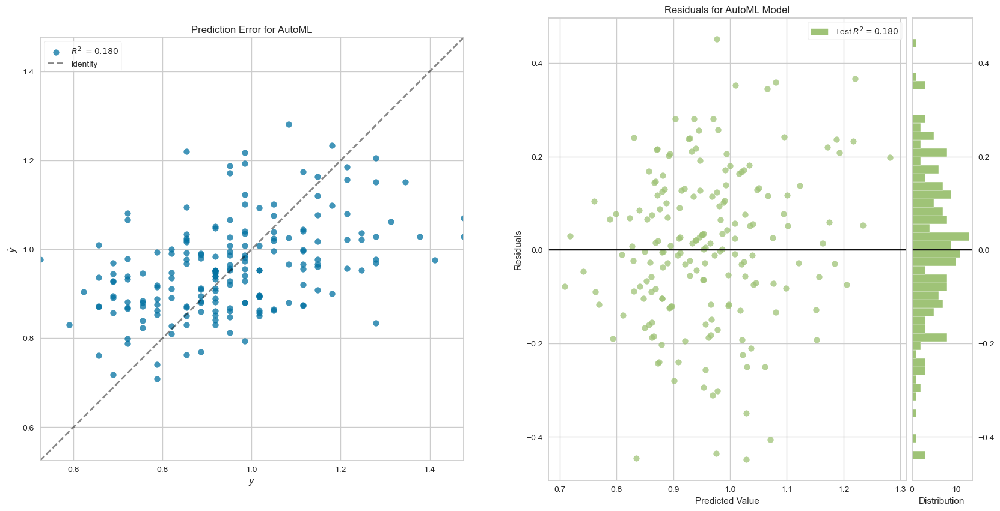

In [97]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

model = automl_pipeline
visualgrid = [
    PredictionError(model, bestfit=False, ax=axes[0]),
    ResidualsPlot(model, ax=axes[1]),
]

for viz in visualgrid:
    viz.score(X_test, y_test)
    viz.finalize()

plt.show()

Flaml did not perform better than stacking model.

<a id = "14"></a><br>
# Feature Importance

In [ ]:
Heavy 

In [ ]:
X_train = X_train.fillna(X_train.mean())

In [ ]:
X_test = X_test.fillna(X_train.mean())

In [102]:
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

In [129]:
xgb_optuna_params = {'n_estimators': 477,
                     'alpha': 2.9194103692830294e-08,
                     'subsample': 0.7766466494145843,
                     'colsample_bytree': 0.4925947764903254,
                     'max_depth': 7,
                     'min_child_weight': 3,
                     'learning_rate': 0.0053782437374451314,
                     'gamma': 0.10907481497487259}

xgb_tunned = XGBRegressor(**xgb_optuna_params, random_state=random_state)

In [130]:
xgb_regressor = xgb_tunned.fit(X_train, y_train)

In [131]:
y_pred = xgb_regressor.predict(X_test)
print(mean_squared_error(y_test, y_pred))
print(mean_absolute_error(y_test, y_pred))
print(r2_score(y_test, y_pred))

0.025347287781262395
0.12591345560558334
0.22832430223039624


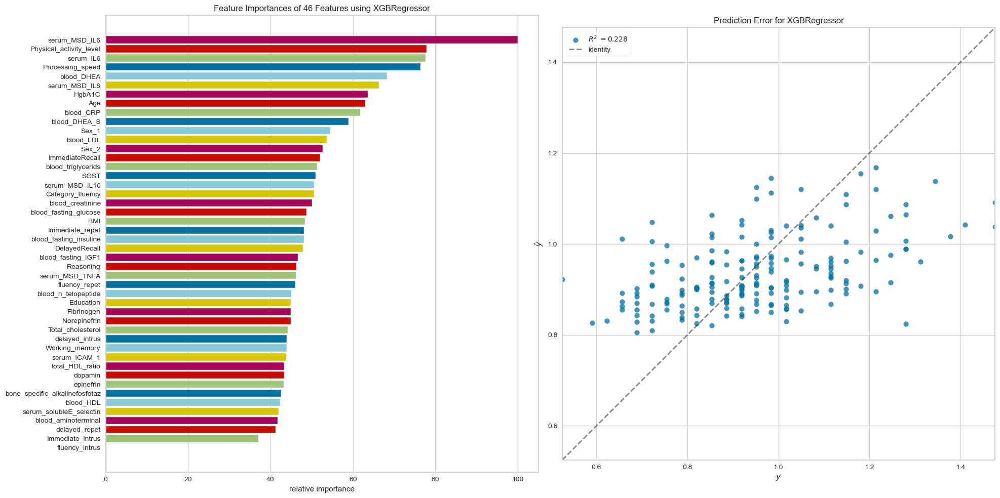

In [138]:
from yellowbrick.features import FeatureImportances
from yellowbrick.regressor import ResidualsPlot, PredictionError

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

model = xgb_regressor
visualgrid = [
    FeatureImportances(model,is_fitted=True, ax=axes[0]),
    PredictionError(model, bestfit=False, ax=axes[1]),
]

for viz in visualgrid:
    viz.fit(X_train, y_train)
    viz.score(X_test, y_test)
    viz.finalize()

plt.show()

###### 